# Velocity comparison - Pancreas E15.5
In this notebook we want to compare if and how the Nuc/Cyt model compared with the original veloVI model solely trained on either snRNA or scRNA data infers RNA velocity and how the estimated velocities correlate. We further train one model on scRNA data which estimates the abundance within the whole cell of the snRNA-seq data.
In this notebook we use the integrated data of the trained `scglue` (GEX) and `scVI` models to estimate abundances and for calculations where we require a neighbor graph.
We further compare different velocity modes within this notebook for the nuc-cyt model


**Requires:**
- `sn_sc_rna_scvi.h5ad`
- `sn_sc_rna_scglue.h5ad`

   (Notebooks: `/notebooks/integration_imputation/`)
- `pancreas_multiome/processed/gex_e14.5.h5ad`

   (Notebook: `/notebooks/data_preprocessing/sn_rna_preprocess_pancreas.ipynb`)
- `pancreas_sc/processed/gex_e14.5.h5ad`

   (Notebook: `/notebooks/data_preprocessing/sc_rna_preprocess_pancreas.ipynb`)

**Output:**
This notebook will output different plots if `SAVE_FIGURES=TRUE`

## Library imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys

import mplscience
import torch
from velovi import VELOVI

import numpy as np
import pandas as pd
from scipy.stats import pearsonr, ttest_ind
from sklearn.preprocessing import MinMaxScaler

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import scvelo as scv
from scvelo.inference import fit_velovi

sys.path.append("../..")
from paths import FIG_DIR, PROJECT_DIR  # isort: skip  # noqa: E402

/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-

## Function Defintions


In [3]:
def compute_confidence(adata, vkey="velocities_velovi"):
    """Computes the velocity confidence of model.

    Parameters
    ----------
    adata
        Annotated data
    vkey
        adata.layers[vkey] should contain inferred velocities
    """
    scv.tl.velocity_graph(adata, vkey=vkey, n_jobs=8)
    scv.tl.velocity_confidence(adata, vkey=vkey)

    g_df = pd.DataFrame()
    g_df["Velocity confidence"] = adata.obs[f"{vkey}_confidence"].to_numpy().ravel()

    return g_df

In [4]:
def _add_significance(ax, left: int, right: int, significance: str, level: int = 0, **kwargs):
    bracket_level = kwargs.pop("bracket_level", 1)
    bracket_height = kwargs.pop("bracket_height", 0.02)
    text_height = kwargs.pop("text_height", 0.01)

    bottom, top = ax.get_ylim()
    y_axis_range = top - bottom

    bracket_level = (y_axis_range * 0.07 * level) + top * bracket_level
    bracket_height = bracket_level - (y_axis_range * bracket_height)

    ax.plot([left, left, right, right], [bracket_height, bracket_level, bracket_level, bracket_height], **kwargs)

    ax.text(
        (left + right) * 0.5,
        bracket_level + (y_axis_range * text_height),
        significance,
        ha="center",
        va="bottom",
        c="k",
    )

In [5]:
def _get_significance(pvalue):
    if pvalue < 0.001:
        return "***"
    elif pvalue < 0.01:
        return "**"
    elif pvalue < 0.1:
        return "*"
    else:
        return "n.s."

In [6]:
def fit_velovi_(bdata):
    """Training function for original veloVI model for scRNA or snRNA data.

    Parameters
    ----------
    bdata
        Annotated data
    """
    VELOVI.setup_anndata(bdata, spliced_layer="Ms", unspliced_layer="Mu")

    vae = VELOVI(bdata)
    vae.train(max_epochs=500)

    latent_time = vae.get_latent_time(n_samples=25)
    velocities = vae.get_velocity(n_samples=25, velo_statistic="mean")

    t = latent_time
    scaling = 20 / t.max(0)

    bdata.layers["velocities_velovi"] = velocities / scaling
    bdata.layers["latent_time_velovi"] = latent_time

    bdata.var["fit_alpha"] = vae.get_rates()["alpha"] / scaling
    bdata.var["fit_beta"] = vae.get_rates()["beta"] / scaling
    bdata.var["fit_gamma"] = vae.get_rates()["gamma"] / scaling
    bdata.var["fit_t_"] = (
        torch.nn.functional.softplus(vae.module.switch_time_unconstr).detach().cpu().numpy()
    ) * scaling
    bdata.layers["fit_t"] = latent_time.values * np.expand_dims(scaling, axis=0)
    bdata.var["fit_scaling"] = scaling

    return vae, bdata

## General settings

In [7]:
SAVE_FIGURES = True

sns.reset_defaults()
sns.reset_orig()
scv.settings.set_figure_params("scvelo", dpi_save=400, dpi=80, transparent=True, fontsize=20, color_map="viridis")

celltype_colors = {
    "Alpha": "#1f78b4",
    "Beta": "#b2df8a",
    "Delta": "#6a3d9a",
    "Ductal": "#8fbc8f",
    "Epsilon": "#cab2d6",
    "Ngn3 high EP": "#fdbf6f",
    "Ngn3 low EP": "#f4a460",
    "Pre-endocrine": "#ff7f00",
}

## Read and preprocess multi-modal Data


In [8]:
# We will here compare scVI and scglue based estimated datasets
adata = sc.read(PROJECT_DIR / "pancreas_sc_multiome" / "sn_sc_rna_scglue_e15.5.h5ad")
adata_scvi = sc.read(PROJECT_DIR / "pancreas_sc_multiome" / "sn_sc_rna_scvi_e15.5.h5ad")
adata

AnnData object with n_obs × n_vars = 8403 × 2000
    obs: 'day', 'celltype', 'n_counts', 'celltype_fine', 'protocol', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size'
    var: 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'neighbors', 'umap'
    obsm: 'X_glue_gex', 'X_umap'
    layers: 'Ms_cyt', 'Ms_nuc', 'Mu_nuc', 'lambda', 'spliced', 'spliced_cell', 'spliced_cytoplasm', 'spliced_nucleus', 'spliced_nucleus_original', 'unspliced', 'unspliced_cell', 'unspliced_nucleus', 'unspliced_nucleus_original'
    obsp: 'connectivities', 'distances'

## Preprocess snRNA, scRNA data for later comparison

In [14]:
adata_sc = sc.read(PROJECT_DIR / "pancreas_sc" / "processed" / "gex_e15.5.h5ad")
adata_sn = sc.read(PROJECT_DIR / "pancreas_multiome" / "processed" / "gex_e15.5.h5ad")

# extract highly variable genes and normalize count data
scv.pp.filter_and_normalize(adata_sc, min_counts=20, n_top_genes=2000)
scv.pp.filter_and_normalize(adata_sn, min_counts=20, n_top_genes=2000)

# calculate neighbor graphs
scv.pp.neighbors(adata_sn)
scv.pp.neighbors(adata_sc)

# snRNA
scv.pp.moments(
    adata_sn,
    use_rep="X_pca",
)

scaler = MinMaxScaler()
adata_sn.layers["Mu"] = scaler.fit_transform(adata_sn.layers["Mu"])

scaler = MinMaxScaler()
adata_sn.layers["Ms"] = scaler.fit_transform(adata_sn.layers["Ms"])

## scRNA
scv.pp.moments(
    adata_sc,
    use_rep="X_pca",
)

scaler = MinMaxScaler()
adata_sc.layers["Mu"] = scaler.fit_transform(adata_sc.layers["Mu"])

scaler = MinMaxScaler()
adata_sc.layers["Ms"] = scaler.fit_transform(adata_sc.layers["Ms"])

Filtered out 4081 genes that are detected 20 counts (spliced).
Normalized count data: spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
Filtered out 1422 genes that are detected 20 counts (spliced).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    ['Ms', 'Mu'] moments of un/spliced abundances (adata.layers)
computing moments based on connectivities
    finished (0:00:00) --> added 
    ['Ms', 'Mu'] moments of un/spliced abundances (adata.layers)


## Fit veloVI Nucleus/ Cytosol Model
Note that we decrease the lr compared to original veloVI, as we might run into NaN issues when inferring mean, var for latent representation

In [15]:
vae_sn_sc, adata = fit_velovi(
    adata, max_epochs=500, unspliced_layer_nuc="Mu_nuc", spliced_layer_nuc="Ms_nuc", spliced_layer_cyt="Ms_cyt", lr=5e-3
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|████| 500/500 [11:04<00:00,  1.33s/it, v_num=1, train_loss_step=-1.47e+4, train_loss_epoch=-1.47e+4]

`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|████| 500/500 [11:04<00:00,  1.33s/it, v_num=1, train_loss_step=-1.47e+4, train_loss_epoch=-1.47e+4]


In [16]:
vae_scvi, adata_scvi = fit_velovi(
    adata_scvi,
    max_epochs=500,
    unspliced_layer_nuc="Mu_nuc",
    spliced_layer_nuc="Ms_nuc",
    spliced_layer_cyt="Ms_cyt",
    lr=5e-3,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|████| 500/500 [11:02<00:00,  1.33s/it, v_num=1, train_loss_step=-1.12e+4, train_loss_epoch=-1.13e+4]

`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|████| 500/500 [11:02<00:00,  1.32s/it, v_num=1, train_loss_step=-1.12e+4, train_loss_epoch=-1.13e+4]


#### Plot losses

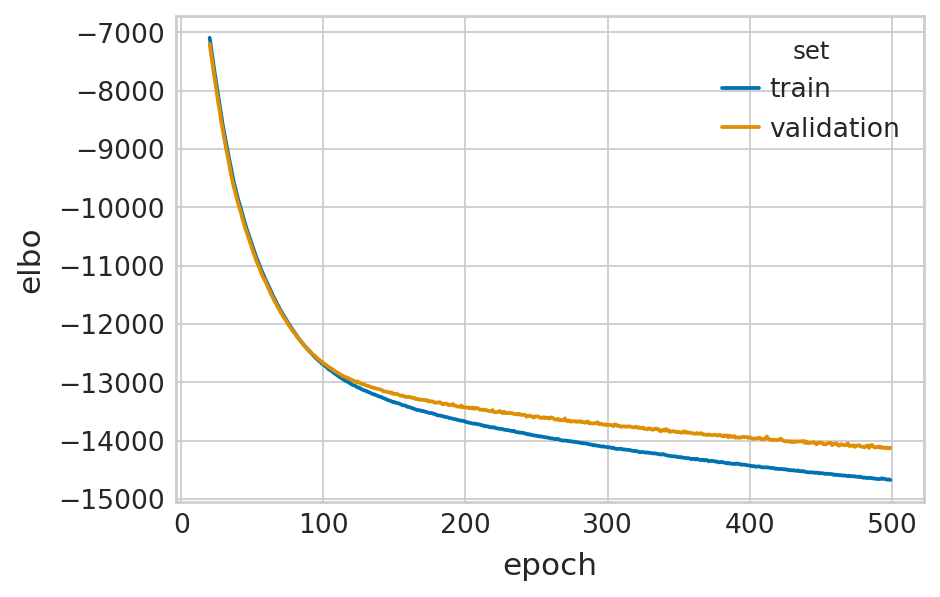

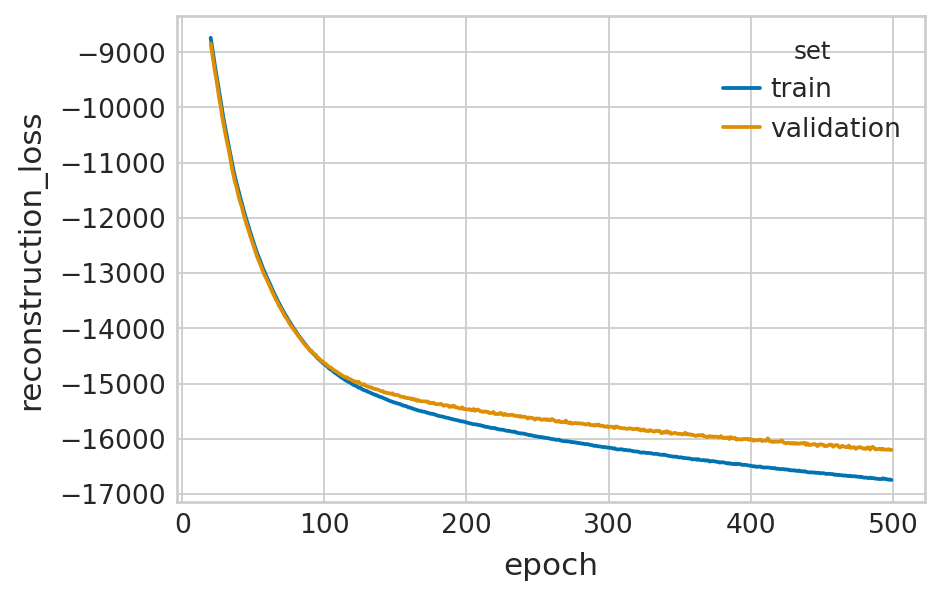

In [17]:
df = vae_sn_sc.history["elbo_train"].iloc[20:].reset_index().rename(columns={"elbo_train": "elbo"})
df["set"] = "train"

_df = vae_sn_sc.history["elbo_validation"].iloc[20:].reset_index().rename(columns={"elbo_validation": "elbo"})
_df["set"] = "validation"

df = pd.concat([df, _df], axis=0).reset_index(drop=True)

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.lineplot(data=df, x="epoch", y="elbo", hue="set", palette=["#0173B2", "#DE8F05"], ax=ax)
    plt.show()

df = (
    vae_sn_sc.history["reconstruction_loss_train"]
    .iloc[20:]
    .reset_index()
    .rename(columns={"reconstruction_loss_train": "reconstruction_loss"})
)
df["set"] = "train"

_df = (
    vae_sn_sc.history["reconstruction_loss_validation"]
    .iloc[20:]
    .reset_index()
    .rename(columns={"reconstruction_loss_validation": "reconstruction_loss"})
)
_df["set"] = "validation"

df = pd.concat([df, _df], axis=0).reset_index(drop=True)

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.lineplot(data=df, x="epoch", y="reconstruction_loss", hue="set", palette=["#0173B2", "#DE8F05"], ax=ax)
    plt.show()

## Fit original veloVI model on scRNA-seq data!

In [18]:
vae_sc, adata_sc = fit_velovi_(adata_sc)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 500/500: 100%|████| 500/500 [03:55<00:00,  2.11it/s, v_num=1, train_loss_step=-9.16e+3, train_loss_epoch=-9.15e+3]

`Trainer.fit` stopped: `max_epochs=500` reached.


Epoch 500/500: 100%|████| 500/500 [03:55<00:00,  2.13it/s, v_num=1, train_loss_step=-9.16e+3, train_loss_epoch=-9.15e+3]


#### Plot losses

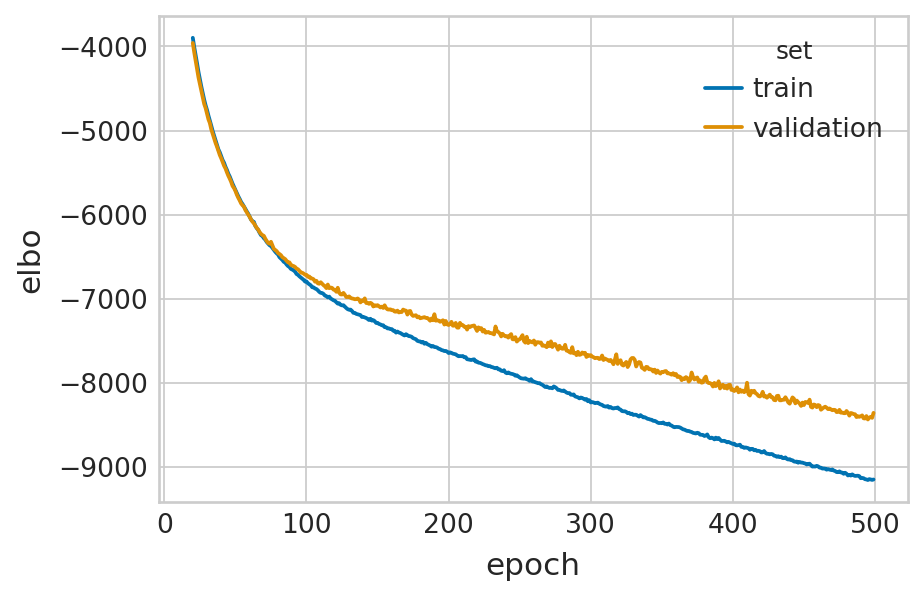

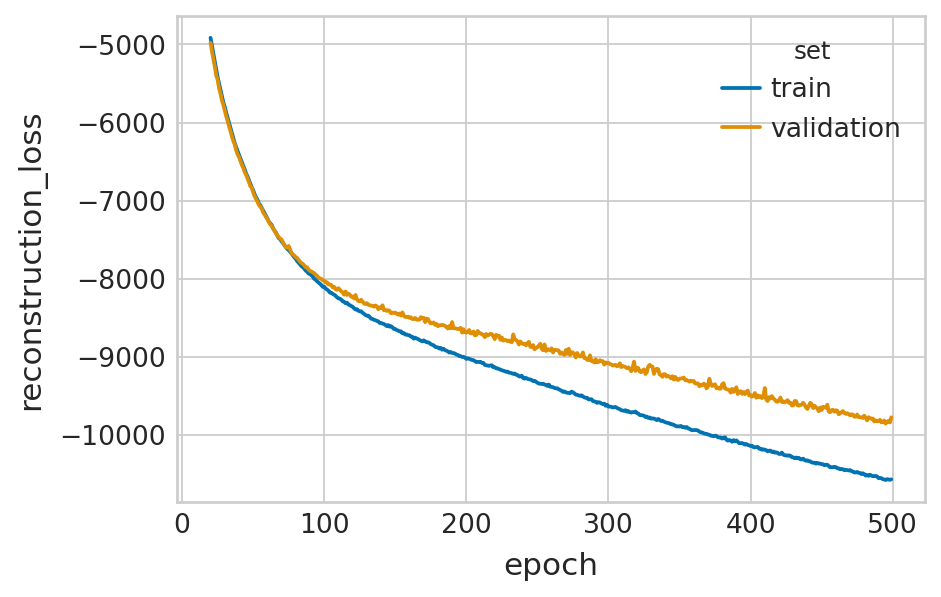

In [19]:
df = vae_sc.history["elbo_train"].iloc[20:].reset_index().rename(columns={"elbo_train": "elbo"})
df["set"] = "train"

_df = vae_sc.history["elbo_validation"].iloc[20:].reset_index().rename(columns={"elbo_validation": "elbo"})
_df["set"] = "validation"

df = pd.concat([df, _df], axis=0).reset_index(drop=True)

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.lineplot(data=df, x="epoch", y="elbo", hue="set", palette=["#0173B2", "#DE8F05"], ax=ax)
    plt.show()

df = (
    vae_sc.history["reconstruction_loss_train"]
    .iloc[20:]
    .reset_index()
    .rename(columns={"reconstruction_loss_train": "reconstruction_loss"})
)
df["set"] = "train"

_df = (
    vae_sc.history["reconstruction_loss_validation"]
    .iloc[20:]
    .reset_index()
    .rename(columns={"reconstruction_loss_validation": "reconstruction_loss"})
)
_df["set"] = "validation"

df = pd.concat([df, _df], axis=0).reset_index(drop=True)

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.lineplot(data=df, x="epoch", y="reconstruction_loss", hue="set", palette=["#0173B2", "#DE8F05"], ax=ax)
    plt.show()

## Fit original veloVI model just on snRNA-seq data

In [22]:
vae_sn, adata_sn = fit_velovi_(adata_sn)

VELOVI Model with the following params: 
n_hidden: 256, n_latent: 10, n_layers: 1, dropout_rate: 0.1
Training status: Trained
Model's adata is minified?: False

#### Plot losses

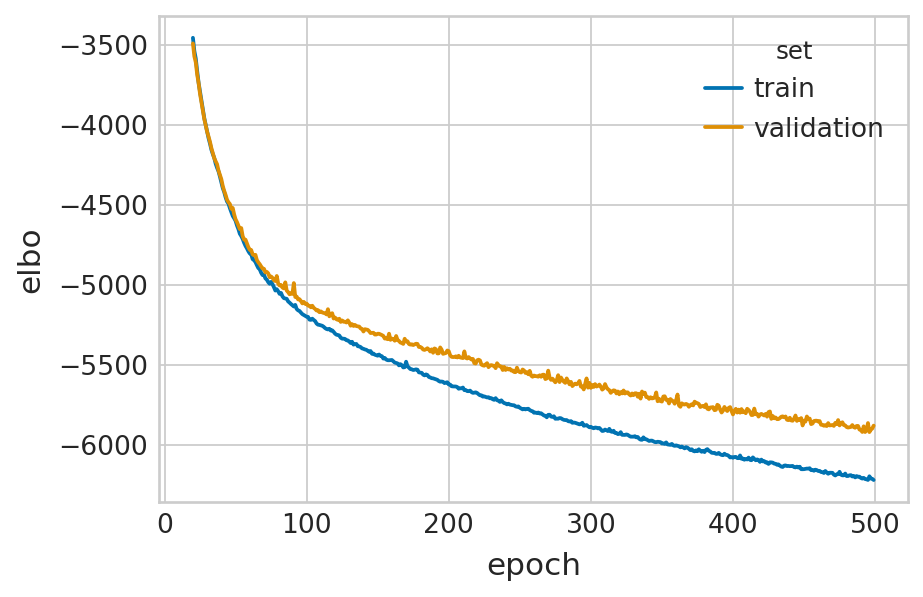

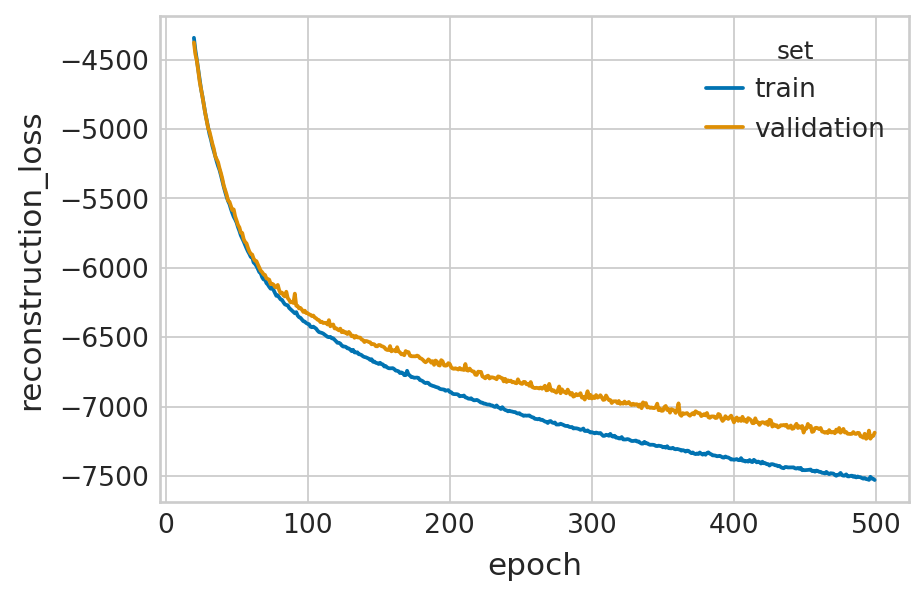

In [21]:
df = vae_sn.history["elbo_train"].iloc[20:].reset_index().rename(columns={"elbo_train": "elbo"})
df["set"] = "train"

_df = vae_sn.history["elbo_validation"].iloc[20:].reset_index().rename(columns={"elbo_validation": "elbo"})
_df["set"] = "validation"

df = pd.concat([df, _df], axis=0).reset_index(drop=True)

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.lineplot(data=df, x="epoch", y="elbo", hue="set", palette=["#0173B2", "#DE8F05"], ax=ax)
    plt.show()

df = (
    vae_sn.history["reconstruction_loss_train"]
    .iloc[20:]
    .reset_index()
    .rename(columns={"reconstruction_loss_train": "reconstruction_loss"})
)
df["set"] = "train"

_df = (
    vae_sn.history["reconstruction_loss_validation"]
    .iloc[20:]
    .reset_index()
    .rename(columns={"reconstruction_loss_validation": "reconstruction_loss"})
)
_df["set"] = "validation"

df = pd.concat([df, _df], axis=0).reset_index(drop=True)

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.lineplot(data=df, x="epoch", y="reconstruction_loss", hue="set", palette=["#0173B2", "#DE8F05"], ax=ax)
    plt.show()

## Sample velocities with different `velo_mode`

In [23]:
# Define colors for celltype and cell cycle phases
adata.uns["celltype_colors"] = celltype_colors
adata_sc.uns["celltype_colors"] = celltype_colors
adata_sn.uns["celltype_colors"] = celltype_colors
adata_scvi.uns["celltype_colors"] = celltype_colors

## Calculate velocities for all velo modes

In [24]:
velocities = vae_sn_sc.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_cyt")
adata.layers["velocities_velovi_s_cyt"] = velocities
velocities = vae_sn_sc.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_nuc")
adata.layers["velocities_velovi_s_nuc"] = velocities
velocities = vae_sn_sc.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="unspliced_nuc")
adata.layers["velocities_velovi_u_nuc"] = velocities

velocities = vae_scvi.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_cyt")
adata_scvi.layers["velocities_velovi_s_cyt"] = velocities
velocities = vae_scvi.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_nuc")
adata_scvi.layers["velocities_velovi_s_nuc"] = velocities
velocities = vae_scvi.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="unspliced_nuc")
adata_scvi.layers["velocities_velovi_u_nuc"] = velocities

velocities = vae_sc.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced")
adata_sc.layers["velocities_velovi"] = velocities
velocities = vae_sc.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="unspliced")
adata_sc.layers["velocities_velovi_u"] = velocities


velocities = vae_sn.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced")
adata_sn.layers["velocities_velovi"] = velocities
velocities = vae_sn.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="unspliced")
adata_sn.layers["velocities_velovi_u"] = velocities

## Velo confidence
`scv.tl.velocity_confidence` requires layers "Ms" to be present --> we will set it to Ms_cyt or Ms_nuc respectivley (as we might use `velocities_velovi_s_nuc` as our velocity vector instead of `velocities_velovi_s_cyt`, see later phase portraits)

In [25]:
dfs = []

adata.layers["Ms"] = adata.layers["Ms_cyt"]
g_df = compute_confidence(adata, "velocities_velovi_s_cyt")
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "Nuc/Cyt model (s_cyt velo)"
dfs.append(g_df)

adata.layers["Ms"] = adata.layers["Ms_nuc"]
g_df = compute_confidence(adata, "velocities_velovi_s_nuc")
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "Nuc/Cyt model (s_nuc velo)"
dfs.append(g_df)

g_df = compute_confidence(adata_sc)
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "sc-model"
dfs.append(g_df)

g_df = compute_confidence(adata_sn)
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "sn-model"
dfs.append(g_df)

conf_df = pd.concat(dfs, axis=0)

computing velocity graph (using 8/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/pyt

    finished (0:00:48) --> added 
    'velocities_velovi_s_cyt_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocities_velovi_s_cyt_length' (adata.obs)
--> added 'velocities_velovi_s_cyt_confidence' (adata.obs)
--> added 'velocities_velovi_s_cyt_confidence_transition' (adata.obs)
computing velocity graph (using 8/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:38) --> added 
    'velocities_velovi_s_nuc_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocities_velovi_s_nuc_length' (adata.obs)
--> added 'velocities_velovi_s_nuc_confidence' (adata.obs)
--> added 'velocities_velovi_s_nuc_confidence_transition' (adata.obs)
computing velocity graph (using 8/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:14) --> added 
    'velocities_velovi_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)
--> added 'velocities_velovi_confidence_transition' (adata.obs)
computing velocity graph (using 8/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:18) --> added 
    'velocities_velovi_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)
--> added 'velocities_velovi_confidence_transition' (adata.obs)


In [26]:
g_df = compute_confidence(adata_sc)
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "sc-model"
dfs.append(g_df)

g_df = compute_confidence(adata_sn)
g_df["Dataset"] = "Pancreas E14.5"
g_df["Method"] = "sn-model"
dfs.append(g_df)

conf_df = pd.concat(dfs, axis=0)

computing velocity graph (using 8/14 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:14) --> added 
    'velocities_velovi_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)
computing velocity graph (using 8/14 cores)


  0%|          | 0/4716 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:19) --> added 
    'velocities_velovi_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocities_velovi_length' (adata.obs)
--> added 'velocities_velovi_confidence' (adata.obs)


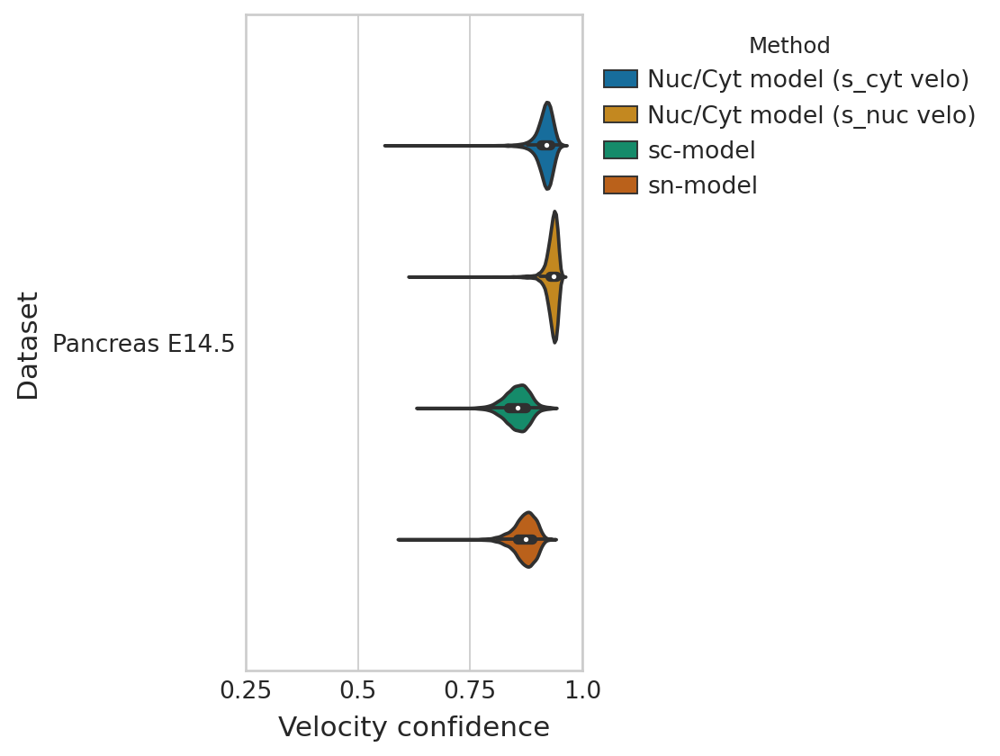

In [27]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(3, 6))
    sns.violinplot(
        data=conf_df,
        ax=ax,
        orient="h",
        y="Dataset",
        x="Velocity confidence",
        hue="Method",
        palette=sns.color_palette("colorblind").as_hex()[:5],
    )
    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    ax.set_xticks([0.25, 0.5, 0.75, 1.0])
    ax.set_xticklabels([0.25, 0.5, 0.75, 1.0])
    plt.show()

## Plot Velo Embedding for all 4 models

#### Nuc-cyt umap scvi

computing velocity graph (using 8/14 cores)


  0%|          | 0/8406 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:27) --> added 
    'velocities_velovi_s_nuc_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_nuc_umap', embedded velocity vectors (adata.obsm)


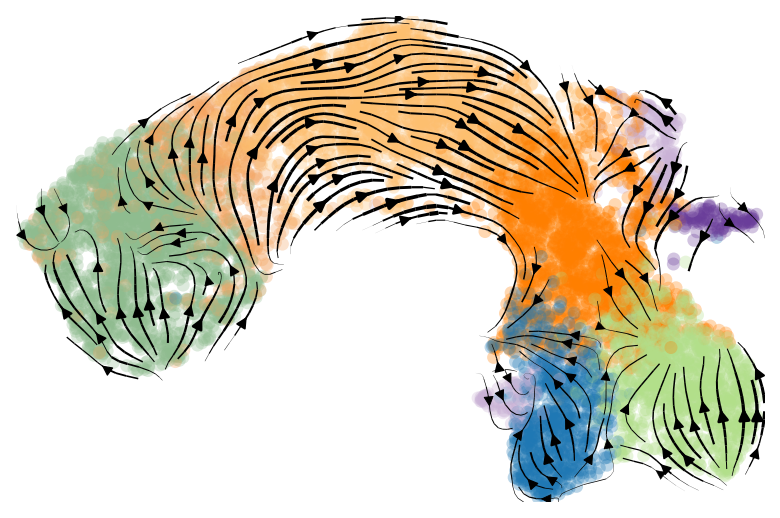

In [28]:
adata_scvi.uns["celltype_colors"] = celltype_colors
scv.tl.velocity_graph(adata_scvi, vkey="velocities_velovi_s_nuc", n_jobs=8, xkey="Ms_nuc")
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_scvi,
        vkey="velocities_velovi_s_nuc",
        color=["celltype"],
        cmap="viridis",
        legend_loc=False,
        title="",
        ax=ax,
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_streams"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_snuc_scvi_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "velo_embedding_snuc_scvi_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
        )

computing velocity graph (using 8/14 cores)


  0%|          | 0/8406 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:26) --> added 
    'velocities_velovi_s_cyt_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_cyt_umap', embedded velocity vectors (adata.obsm)


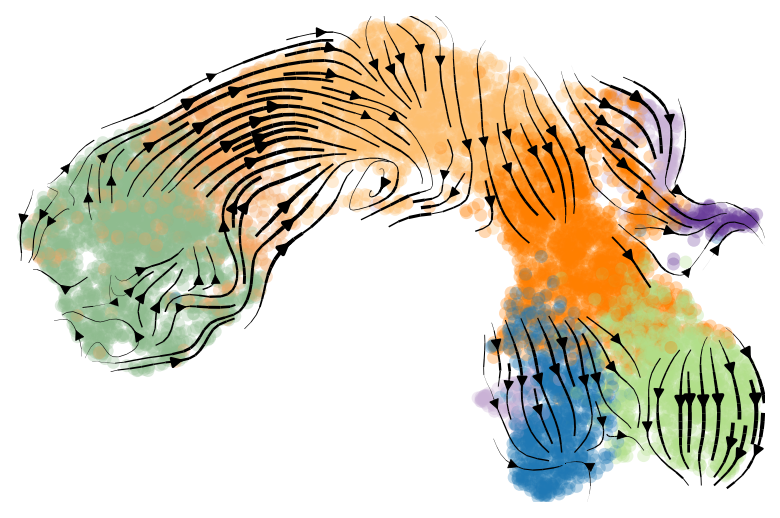

In [29]:
scv.tl.velocity_graph(adata_scvi, vkey="velocities_velovi_s_cyt", n_jobs=8, xkey="Ms_cyt")
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_scvi,
        vkey="velocities_velovi_s_cyt",
        color=["celltype"],
        cmap="viridis",
        legend_loc=False,
        title="",
        ax=ax,
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_streams"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_scyt_scvi_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "velo_embedding_scyt_scvi_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
        )

computing velocity graph (using 8/14 cores)


  0%|          | 0/8406 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:27) --> added 
    'velocities_velovi_s_sum_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_sum_umap', embedded velocity vectors (adata.obsm)


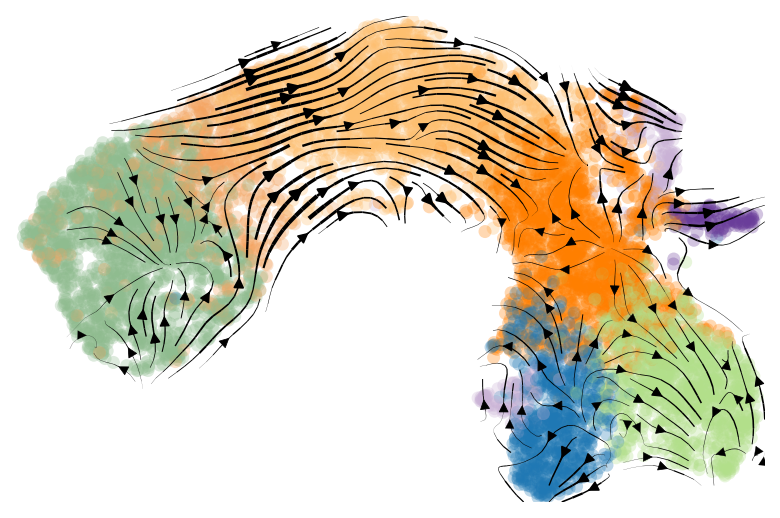

In [30]:
velocities = vae_scvi.get_velocity(n_samples=25, velo_statistic="mean", velo_mode="spliced_sum")
adata_scvi.layers["velocities_velovi_s_sum"] = velocities
scv.tl.velocity_graph(adata_scvi, vkey="velocities_velovi_s_sum", n_jobs=8, xkey="Ms_sum")

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata_scvi,
        vkey="velocities_velovi_s_sum",
        color=["celltype"],
        cmap="viridis",
        legend_loc=False,
        title="",
        ax=ax,
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_streams"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_ssum_scvi_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "velo_embedding_ssum_scvi_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
        )

#### Nuc-cyt umap scglue

computing velocity graph (using 8/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:38) --> added 
    'velocities_velovi_s_nuc_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_nuc_umap', embedded velocity vectors (adata.obsm)


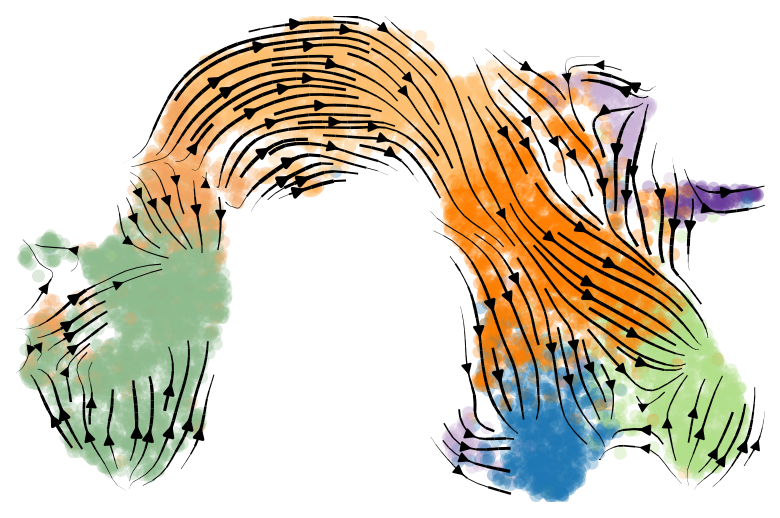

In [31]:
adata.uns["celltype_colors"] = celltype_colors
scv.tl.velocity_graph(adata, vkey="velocities_velovi_s_nuc", n_jobs=8, xkey="Ms_nuc")
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata, vkey="velocities_velovi_s_nuc", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_streams"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_snuc_scglue_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "velo_embedding_snuc_scglue_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
        )

computing velocity graph (using 8/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



    finished (0:00:37) --> added 
    'velocities_velovi_s_cyt_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_cyt_umap', embedded velocity vectors (adata.obsm)


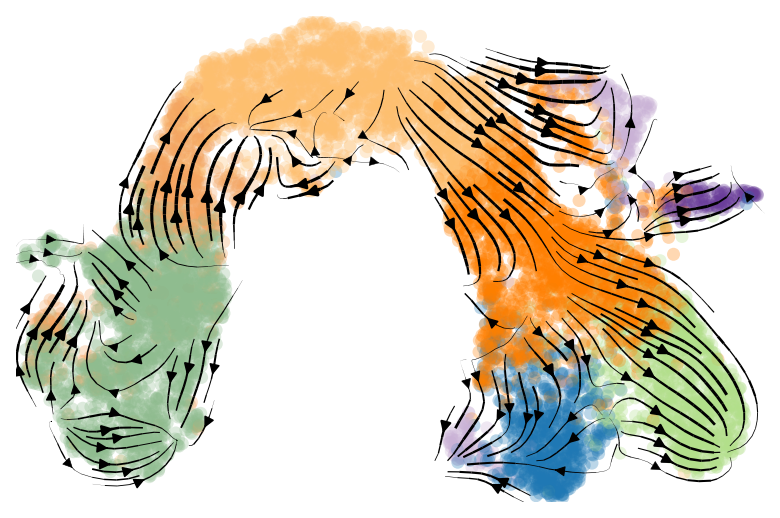

In [32]:
adata.uns["celltype_colors"] = celltype_colors
scv.tl.velocity_graph(adata, vkey="velocities_velovi_s_cyt", n_jobs=8, xkey="Ms_cyt")
with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata, vkey="velocities_velovi_s_cyt", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_streams"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_scyt_scglue_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "velo_embedding_scyt_scglue_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
        )

computing velocity graph (using 2/14 cores)


  0%|          | 0/8403 [00:00<?, ?cells/s]

/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/vol/storage/miniconda3/envs/conda_env_robin/lib/pyt

    finished (0:02:00) --> added 
    'velocities_velovi_s_sum_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:01) --> added
    'velocities_velovi_s_sum_umap', embedded velocity vectors (adata.obsm)


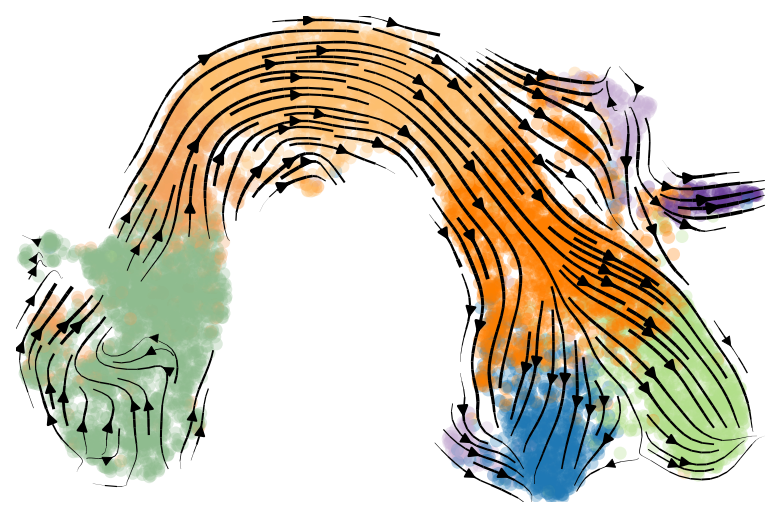

In [33]:
adata.layers["Ms_sum"] = adata.layers["Ms_nuc"] + adata.layers["Ms_cyt"]
adata.layers["velocities_velovi_s_sum"] = (
    adata.layers["velocities_velovi_s_nuc"] + adata.layers["velocities_velovi_s_cyt"]
)
scv.tl.velocity_graph(adata, vkey="velocities_velovi_s_sum", n_jobs=2, xkey="Ms_sum")

with mplscience.style_context():
    fig, ax = plt.subplots(figsize=(6, 4))
    scv.pl.velocity_embedding_stream(
        adata, vkey="velocities_velovi_s_sum", color=["celltype"], cmap="viridis", legend_loc=False, title="", ax=ax
    )
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_streams"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_embedding_ssum_scglue_e15.svg", format="svg", transparent=True, bbox_inches="tight")
        fig.savefig(
            path / "velo_embedding_ssum_scglue_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
        )

#### Single-cell umap

computing velocity embedding
    finished (0:00:00) --> added
    'velocities_velovi_umap', embedded velocity vectors (adata.obsm)


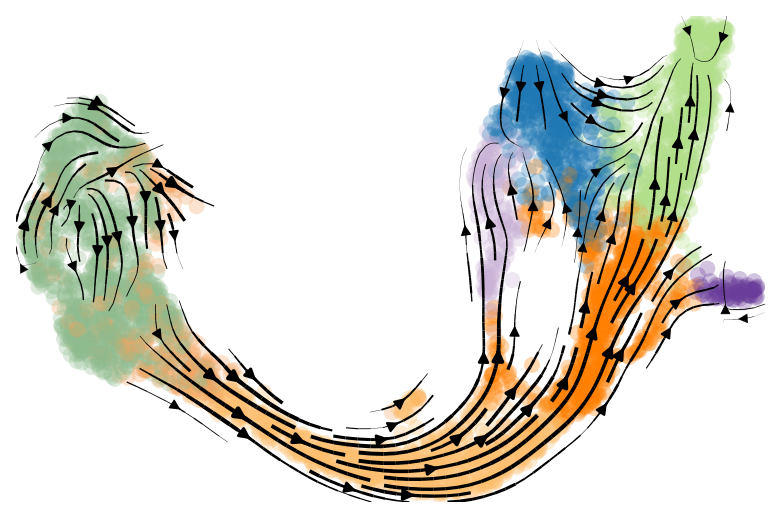

In [34]:
scv.tl.umap(adata_sc)
scv.pl.velocity_embedding_stream(
    adata_sc, vkey="velocities_velovi", color=["celltype"], cmap="viridis", legend_loc=False, title=""
)
plt.show()

#### Single-nucleus umap

computing velocity embedding
    finished (0:00:00) --> added
    'velocities_velovi_umap', embedded velocity vectors (adata.obsm)


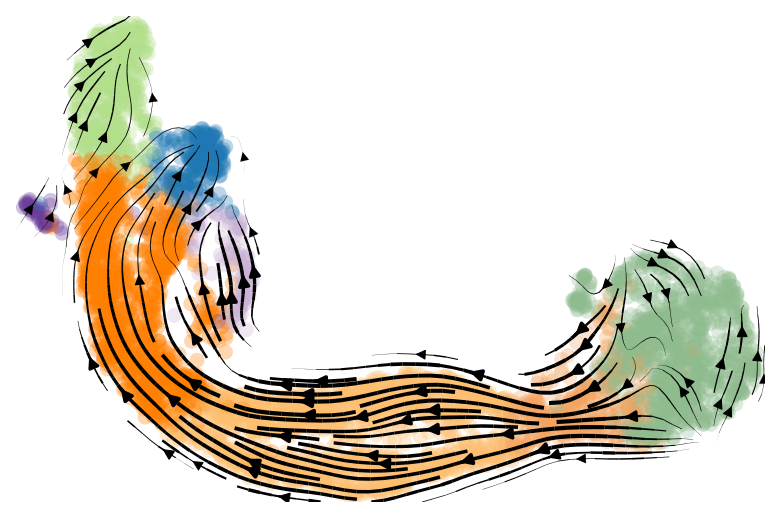

In [35]:
scv.tl.umap(adata_sn)
scv.pl.velocity_embedding_stream(
    adata_sn, vkey="velocities_velovi", color=["celltype"], cmap="viridis", legend_loc=False, title=""
)
plt.show()

## Now we want to investigate inferred velocities of different genes

In [36]:
plot_genes = ["Hells", "Top2a", "Sulf2"]
# get common cell names
sc_cells = list(set(adata_sc.obs_names).intersection(set(adata.obs_names)))
sn_cells = list(set(adata_sn.obs_names).intersection(set(adata.obs_names)))

#### 1. Compare the inferred velo_modes for the Nuc/Cyt model
PLot phase portraits

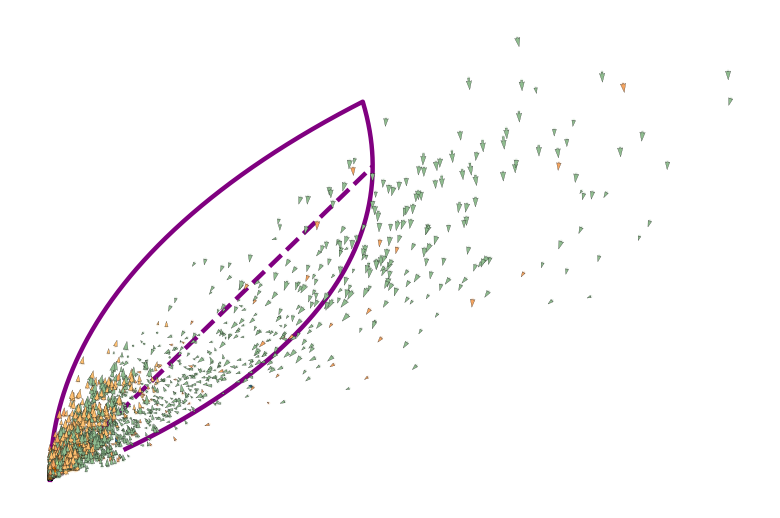

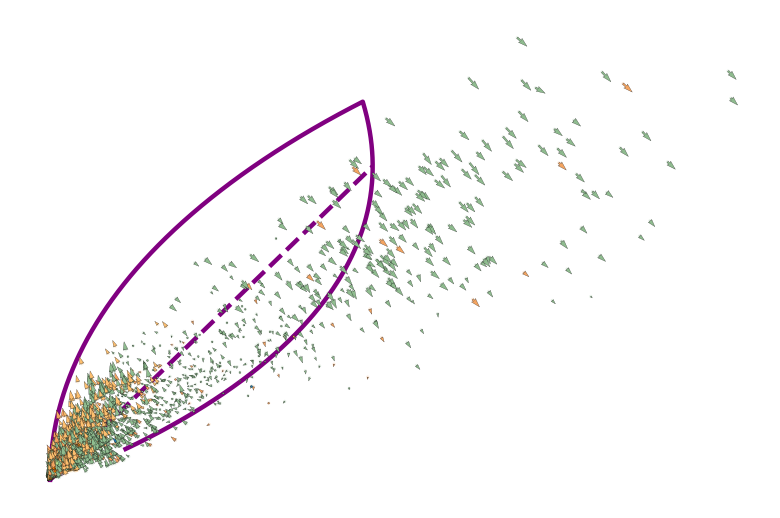

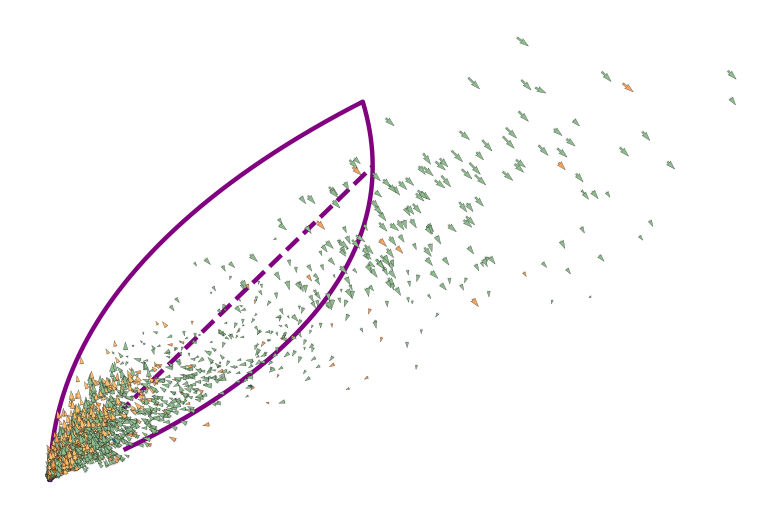

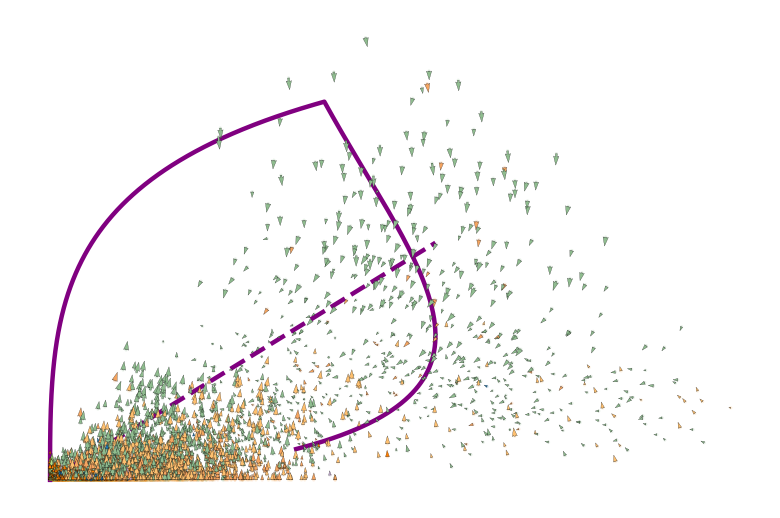

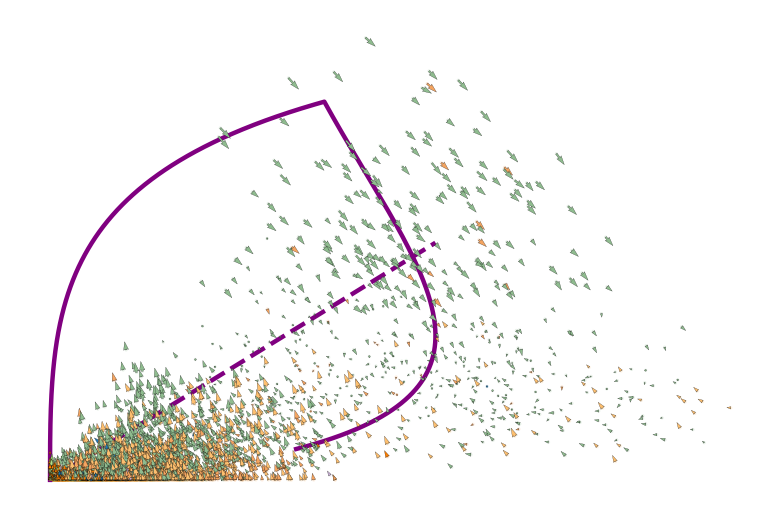

...

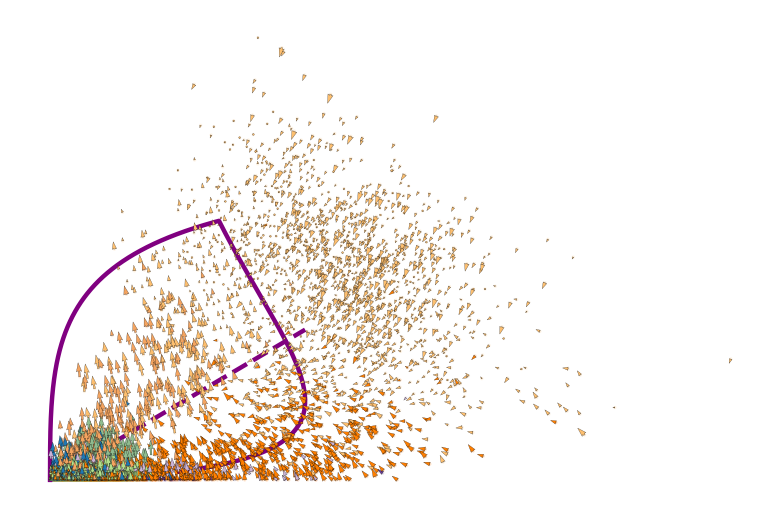

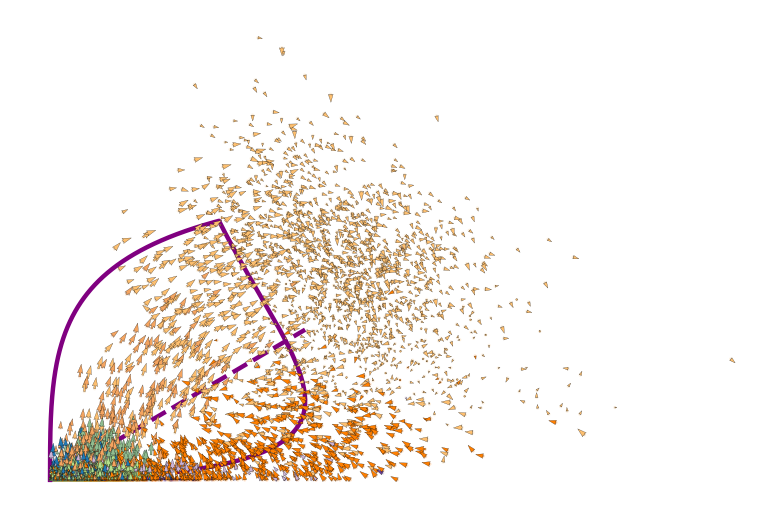

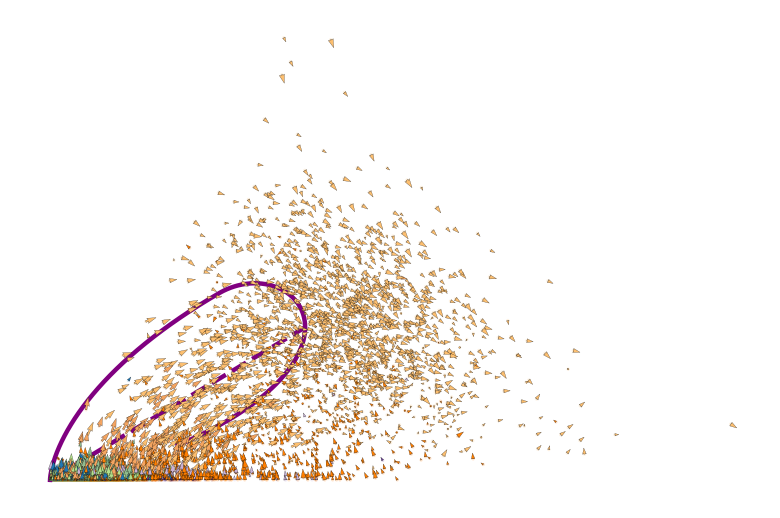

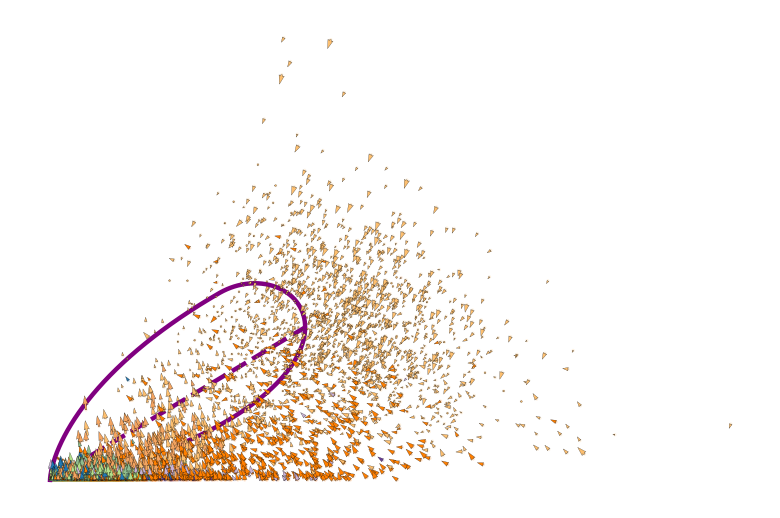

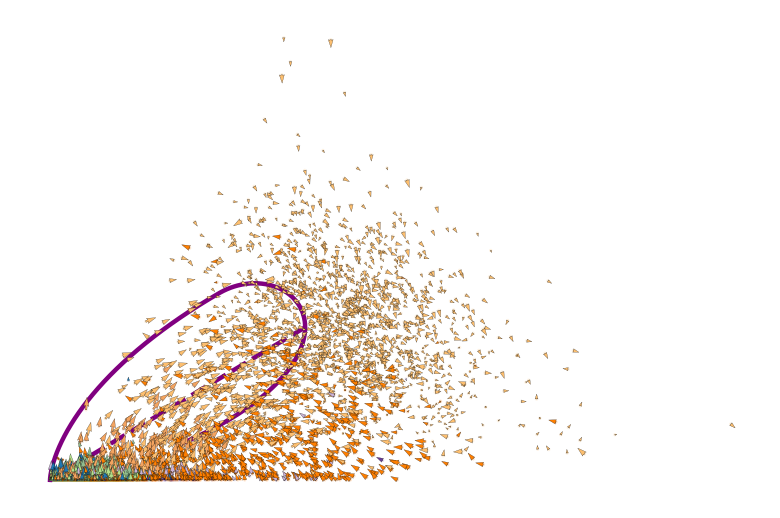

In [37]:
# define velocities_velovi_s_nuc_u, velocities_velovi_s_cyt_u for plotting purposes
adata.layers["velocities_velovi_s_cyt_u"] = adata.layers["velocities_velovi_u_nuc"].copy()
adata.layers["velocities_velovi_s_nuc_u"] = adata.layers["velocities_velovi_u_nuc"].copy()
adata.layers["velocities_velovi_s_sum_u"] = adata.layers["velocities_velovi_u_nuc"].copy()

for gene in plot_genes:
    # Ms_nuc vs Mu_nuc
    adata.layers["Mu"] = adata.layers["Mu_nuc"]
    adata.layers["Ms"] = adata.layers["Ms_nuc"]
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_nuc",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_nuc", "Mu_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_snuc_velo_snuc_unuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_cyt",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_nuc", "Mu_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_scyt_velo_snuc_unuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_sum",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_nuc", "Mu_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_ssum_velo_snuc_unuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    # Ms_cyt vs. Mu_nuc
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    adata.layers["Mu"] = adata.layers["Mu_nuc"]
    adata.layers["Ms"] = adata.layers["Ms_cyt"]
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_nuc",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_cyt", "Mu_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_snuc_velo_scyt_unuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_cyt",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_cyt", "Mu_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_scyt_velo_scyt_unuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_sum",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_cyt", "Mu_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_ssum_velo_scyt_unuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    # Ms_cyt vs. Ms_nuc
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    adata.layers["Mu"] = adata.layers["Ms_nuc"]
    adata.layers["Ms"] = adata.layers["Ms_cyt"]
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_nuc",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_cyt", "Ms_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_snuc_velo_scyt_snuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_cyt",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_cyt", "Ms_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_scyt_velo_scyt_snuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

    fig, ax = plt.subplots(figsize=(6, 4))
    ax.axis("off")
    ax = scv.pl.velocity_embedding(
        adata,
        vkey="velocities_velovi_s_sum",
        basis=gene,
        fontsize=16,
        frameon=False,
        color="celltype",
        legend_loc=None,
        show=False,
        title="",
        ax=ax,
    )
    scv.pl.plot_nuc_cyt_dynamics(adata, gene, "purple", ax, "Ms_cyt", "Ms_nuc")
    plt.show()
    fig.savefig(
        FIG_DIR / f"{gene}_ssum_velo_scyt_snuc_e15.png", format="png", dpi=500, transparent=True, bbox_inches="tight"
    )

## same for scvi

In [38]:
# define velocities_velovi_s_nuc_u, velocities_velovi_s_cyt_u for plotting purposes
adata_scvi.layers["velocities_velovi_s_cyt_u"] = adata_scvi.layers["velocities_velovi_u_nuc"].copy()
adata_scvi.layers["velocities_velovi_s_nuc_u"] = adata_scvi.layers["velocities_velovi_u_nuc"].copy()
adata_scvi.layers["velocities_velovi_s_sum_u"] = adata_scvi.layers["velocities_velovi_u_nuc"].copy()

## Compare inferred velocities between models

#### 1. Compare velocities of model trained on scRNA data and the Nuc/Cyt model

velocities_velovi_s_nuc

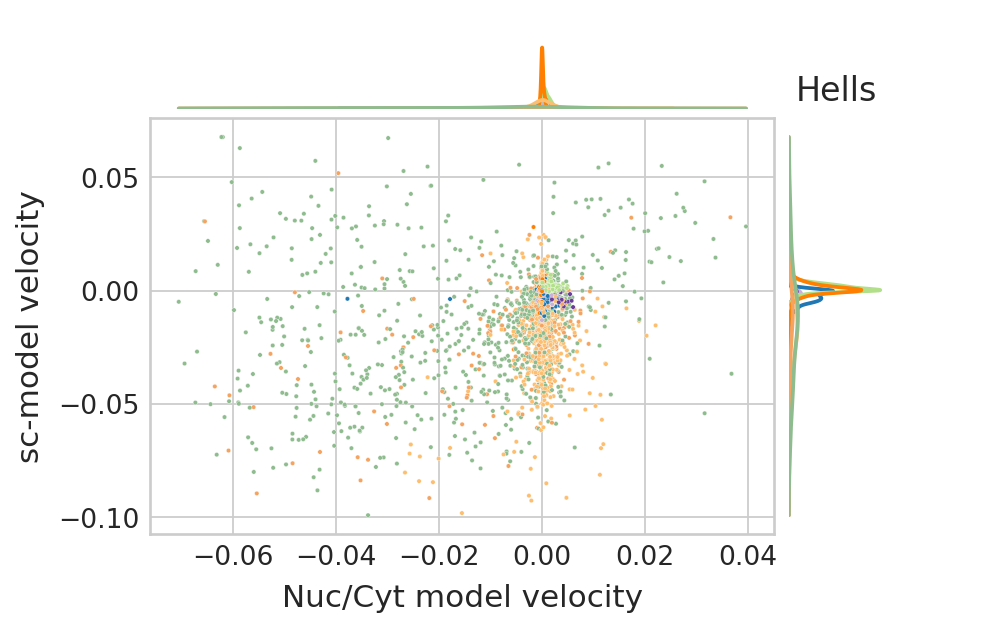

Pearson correlation for Hells of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.2802658191488891, pvalue=1.1207885586548187e-67) 



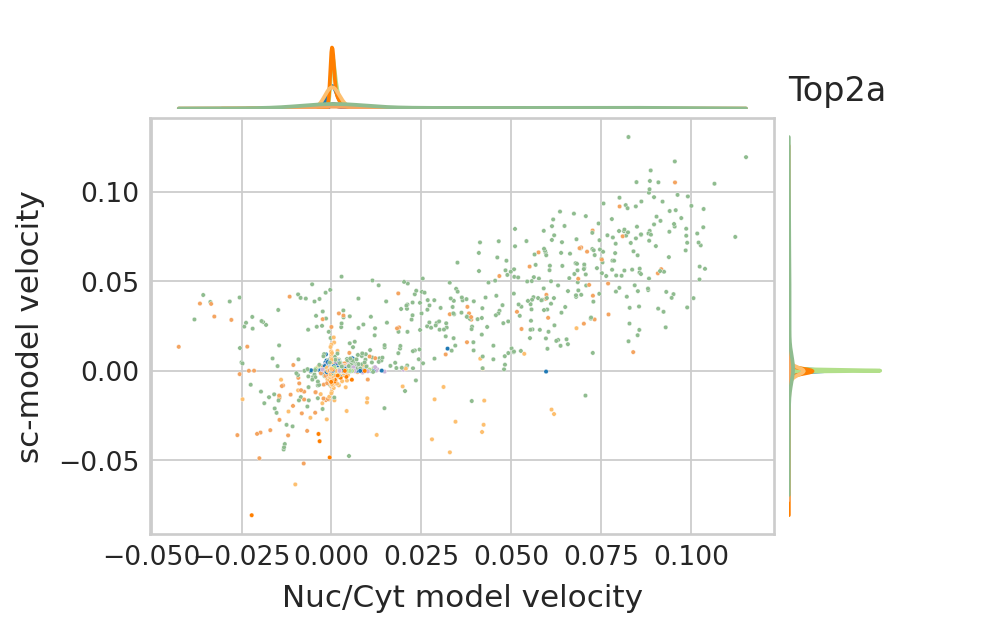

Pearson correlation for Top2a of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.8357206182249295, pvalue=0.0) 



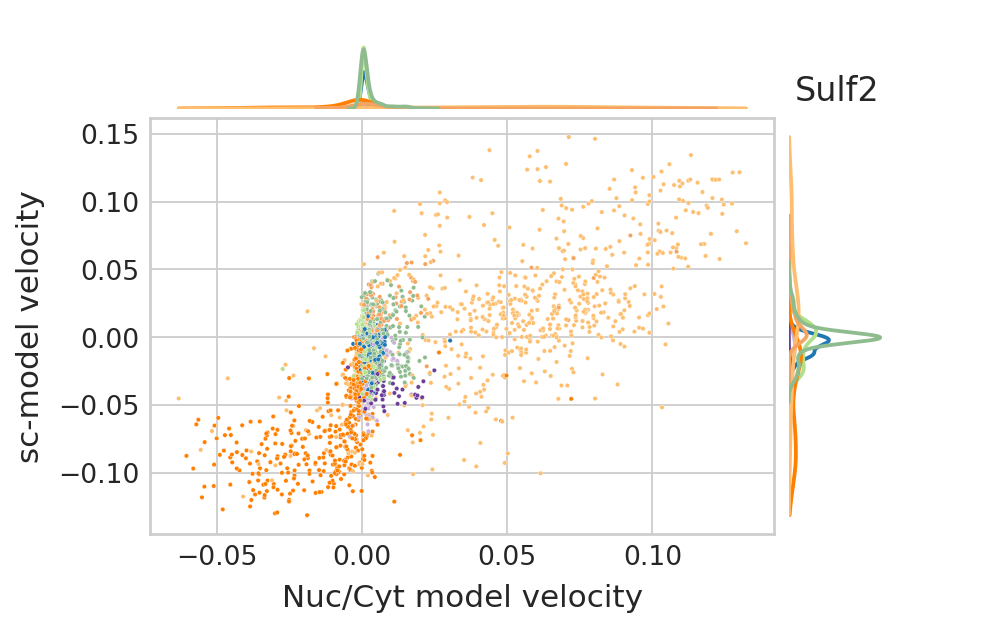

Pearson correlation for Sulf2 of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.6097356446719597, pvalue=0.0) 



In [39]:
palette = celltype_colors
for gene in plot_genes:
    with mplscience.style_context():
        sns.set_style(style="whitegrid")
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.axis("off")
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        spacing = 0.015
        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom + height + spacing, width, 0.1]
        rect_histy = [left + width + spacing, bottom, 0.1, height]

        ax = fig.add_axes(rect_scatter)
        ax_histx = fig.add_axes(rect_histx, sharex=ax)
        ax_histy = fig.add_axes(rect_histy, sharey=ax)
        ax_histx.axis("off")
        ax_histy.axis("off")

        df = pd.DataFrame()
        df["sc-model velocity"] = adata_sc[sc_cells, gene].to_df("velocities_velovi")
        df["Nuc/Cyt model velocity"] = adata[sc_cells, gene].to_df("velocities_velovi_s_nuc")
        df["Celltype"] = adata[sc_cells, gene].obs.celltype
        clipy = (df["sc-model velocity"].min(), df["sc-model velocity"].max())
        clipx = (df["Nuc/Cyt model velocity"].min(), df["Nuc/Cyt model velocity"].max())
        sns.kdeplot(
            data=df,
            y="sc-model velocity",
            hue="Celltype",
            ax=ax_histy,
            legend=False,
            clip=clipy,
            palette=palette,
        )
        sns.kdeplot(
            data=df,
            x="Nuc/Cyt model velocity",
            hue="Celltype",
            ax=ax_histx,
            legend=False,
            clip=clipx,
            palette=palette,
        )
        sns.scatterplot(
            y="sc-model velocity",
            x="Nuc/Cyt model velocity",
            data=df,
            hue="Celltype",
            s=4,
            palette=palette,
            ax=ax,
            legend=False,
        )
        plt.title(f"{gene}")

        plt.show()
        print(
            f"Pearson correlation for {gene} of inferred Nuc/Cyt-model velocities and sc-model velocities",
            pearsonr(
                adata_sc[sc_cells, gene].to_df("velocities_velovi").squeeze(),
                adata[sc_cells, gene].to_df("velocities_velovi_s_nuc").squeeze(),
            ),
            "\n",
        )
        if SAVE_FIGURES:
            path = FIG_DIR / "velocity_comparison"
            path.mkdir(parents=True, exist_ok=True)
            fig.savefig(
                path / f"velo_s_nuc_{gene}_nuccyt_sc_e15.svg",
                format="svg",
                transparent=True,
                bbox_inches="tight",
            )

velocities_velovi_s_cyt

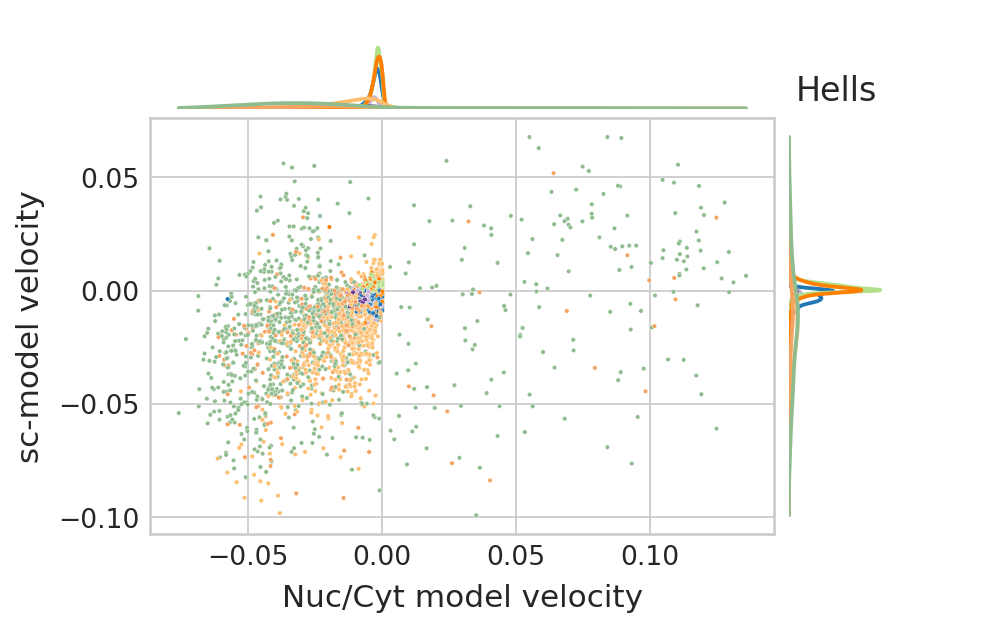

Pearson correlation for Hells of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.40016800793930385, pvalue=3.3943850574952715e-142) 



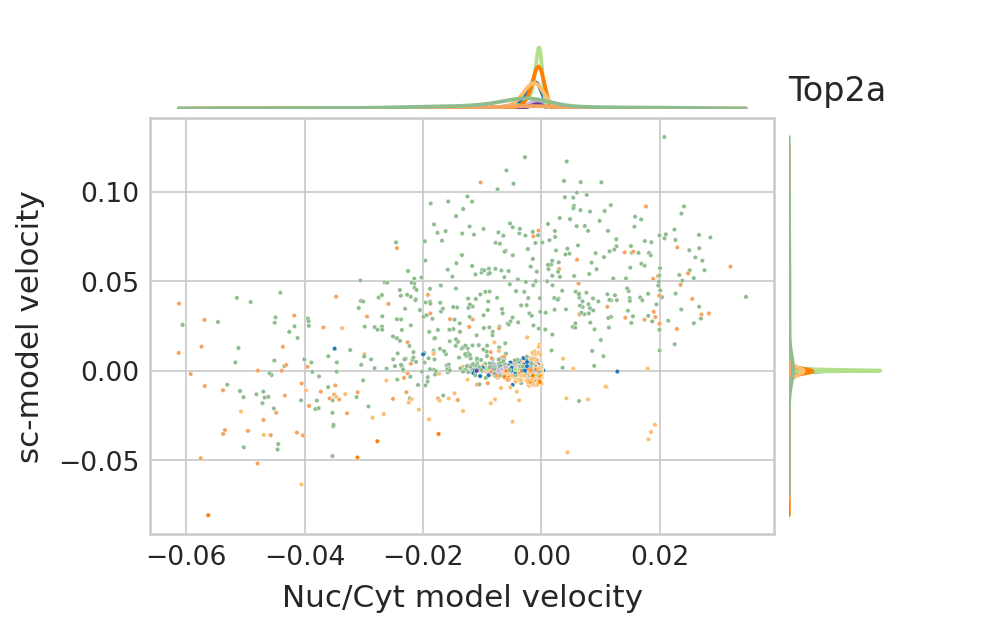

Pearson correlation for Top2a of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.17338277258250578, pvalue=2.4655141214588807e-26) 



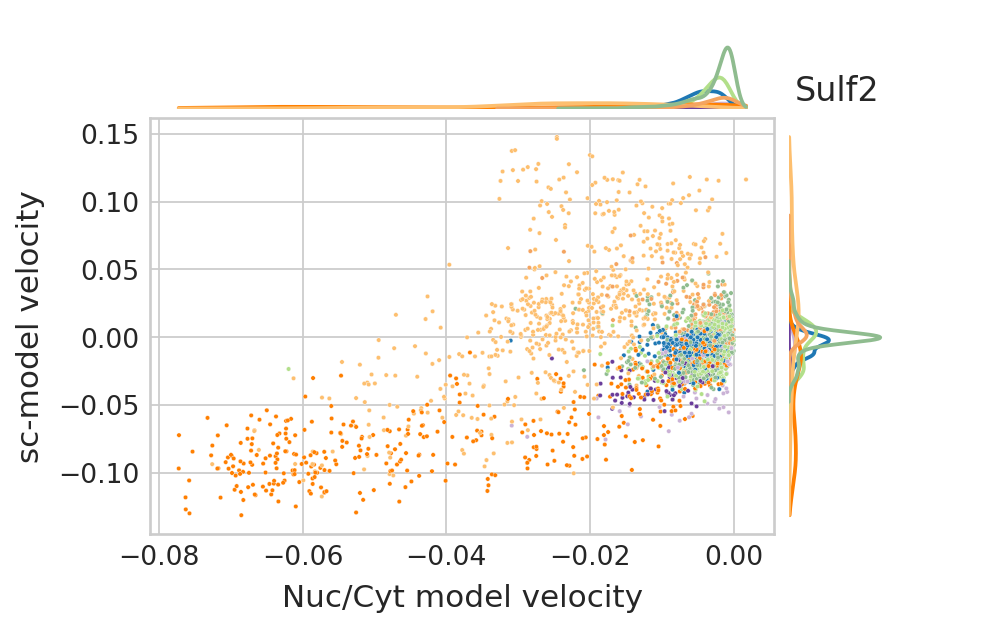

Pearson correlation for Sulf2 of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.48137858213859275, pvalue=9.644500273749602e-214) 



In [40]:
for gene in plot_genes:
    with mplscience.style_context():
        sns.set_style(style="whitegrid")
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.axis("off")
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        spacing = 0.015
        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom + height + spacing, width, 0.1]
        rect_histy = [left + width + spacing, bottom, 0.1, height]

        ax = fig.add_axes(rect_scatter)
        ax_histx = fig.add_axes(rect_histx, sharex=ax)
        ax_histy = fig.add_axes(rect_histy, sharey=ax)
        ax_histx.axis("off")
        ax_histy.axis("off")

        df = pd.DataFrame()
        df["sc-model velocity"] = adata_sc[sc_cells, gene].to_df("velocities_velovi")
        df["Nuc/Cyt model velocity"] = adata[sc_cells, gene].to_df("velocities_velovi_s_cyt")
        df["Celltype"] = adata[sc_cells, gene].obs.celltype
        clipy = (df["sc-model velocity"].min(), df["sc-model velocity"].max())
        clipx = (df["Nuc/Cyt model velocity"].min(), df["Nuc/Cyt model velocity"].max())
        sns.kdeplot(
            data=df,
            y="sc-model velocity",
            hue="Celltype",
            ax=ax_histy,
            legend=False,
            clip=clipy,
            palette=palette,
        )
        sns.kdeplot(
            data=df,
            x="Nuc/Cyt model velocity",
            hue="Celltype",
            ax=ax_histx,
            legend=False,
            clip=clipx,
            palette=palette,
        )
        sns.scatterplot(
            y="sc-model velocity",
            x="Nuc/Cyt model velocity",
            data=df,
            hue="Celltype",
            s=4,
            palette=palette,
            ax=ax,
            legend=False,
        )
        plt.title(f"{gene}")
        plt.show()
        print(
            f"Pearson correlation for {gene} of inferred Nuc/Cyt-model velocities and sc-model velocities",
            pearsonr(
                adata_sc[sc_cells, gene].to_df("velocities_velovi").squeeze(),
                adata[sc_cells, gene].to_df("velocities_velovi_s_cyt").squeeze(),
            ),
            "\n",
        )
        if SAVE_FIGURES:
            path = FIG_DIR / "velocity_comparison"
            path.mkdir(parents=True, exist_ok=True)
            fig.savefig(
                path / f"velo_s_cyt_{gene}_nuccyt_sc_e15.svg",
                format="svg",
                transparent=True,
                bbox_inches="tight",
            )

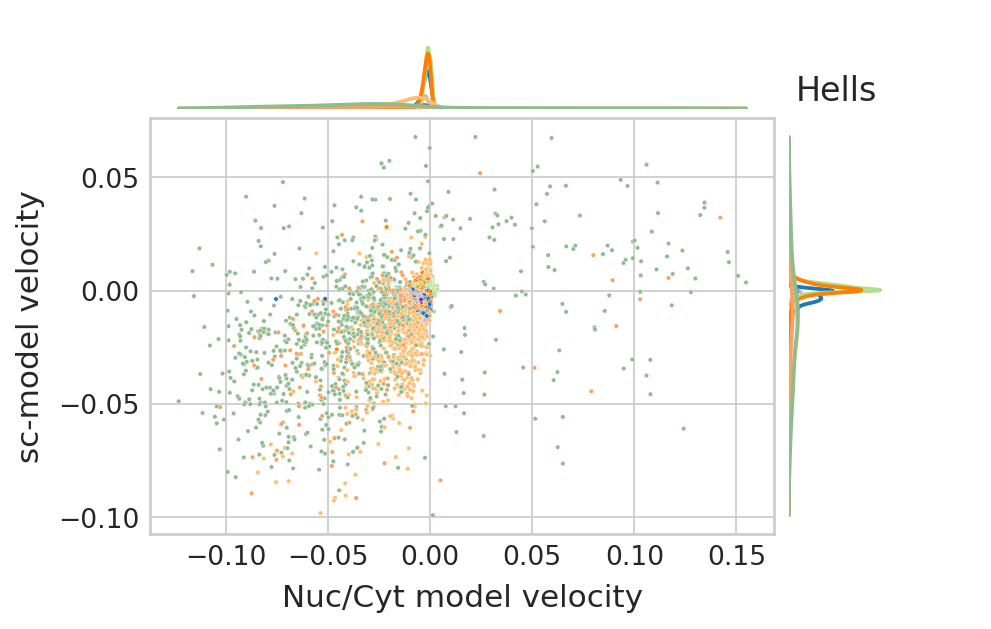

Pearson correlation for Hells of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.4801944284243046, pvalue=1.4904288295473025e-212) 



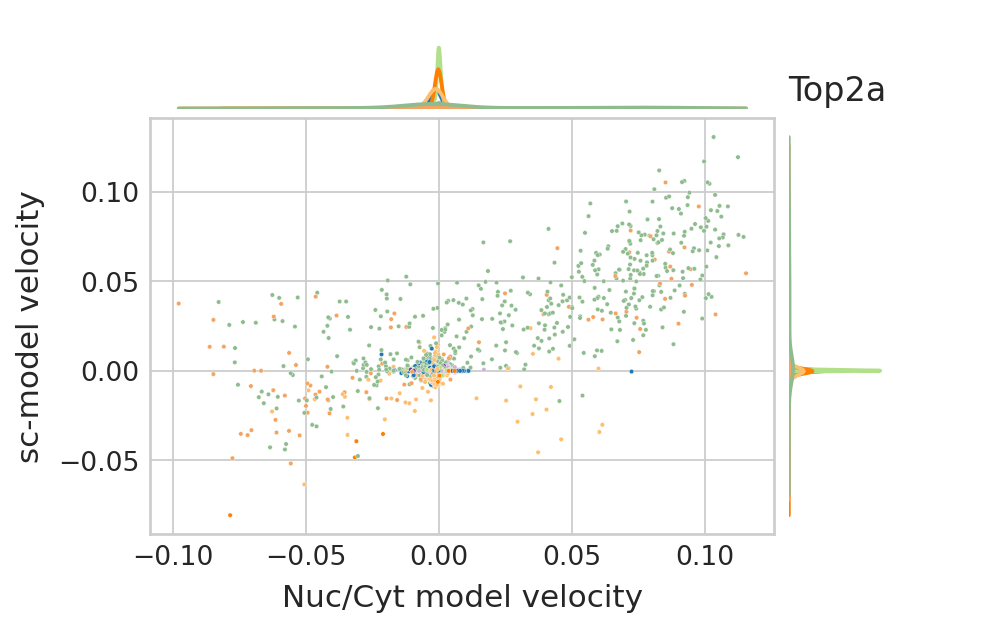

Pearson correlation for Top2a of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.7786654167738436, pvalue=0.0) 



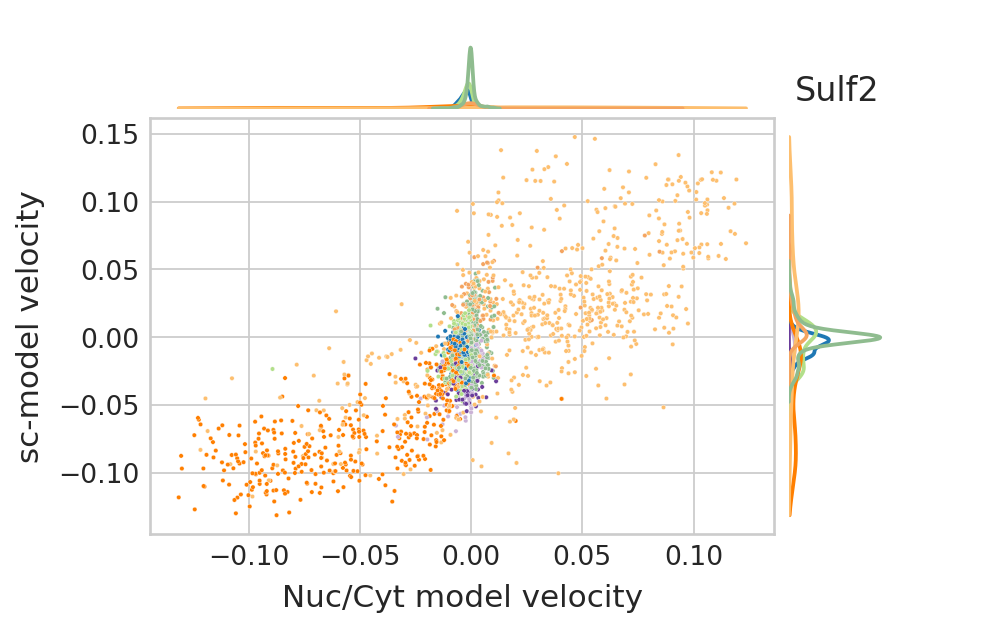

Pearson correlation for Sulf2 of inferred Nuc/Cyt-model velocities and sc-model velocities PearsonRResult(statistic=0.765054553145144, pvalue=0.0) 



In [41]:
for gene in plot_genes:
    with mplscience.style_context():
        sns.set_style(style="whitegrid")
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.axis("off")
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        spacing = 0.015
        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom + height + spacing, width, 0.1]
        rect_histy = [left + width + spacing, bottom, 0.1, height]

        ax = fig.add_axes(rect_scatter)
        ax_histx = fig.add_axes(rect_histx, sharex=ax)
        ax_histy = fig.add_axes(rect_histy, sharey=ax)
        ax_histx.axis("off")
        ax_histy.axis("off")

        df = pd.DataFrame()
        df["sc-model velocity"] = adata_sc[sc_cells, gene].to_df("velocities_velovi")
        df["Nuc/Cyt model velocity"] = adata[sc_cells, gene].to_df("velocities_velovi_s_sum")
        df["Celltype"] = adata[sc_cells, gene].obs.celltype
        clipy = (df["sc-model velocity"].min(), df["sc-model velocity"].max())
        clipx = (df["Nuc/Cyt model velocity"].min(), df["Nuc/Cyt model velocity"].max())
        sns.kdeplot(
            data=df,
            y="sc-model velocity",
            hue="Celltype",
            ax=ax_histy,
            legend=False,
            clip=clipy,
            palette=palette,
        )
        sns.kdeplot(
            data=df,
            x="Nuc/Cyt model velocity",
            hue="Celltype",
            ax=ax_histx,
            legend=False,
            clip=clipx,
            palette=palette,
        )
        sns.scatterplot(
            y="sc-model velocity",
            x="Nuc/Cyt model velocity",
            data=df,
            hue="Celltype",
            s=4,
            palette=palette,
            ax=ax,
            legend=False,
        )
        plt.title(f"{gene}")
        plt.show()
        print(
            f"Pearson correlation for {gene} of inferred Nuc/Cyt-model velocities and sc-model velocities",
            pearsonr(
                adata_sc[sc_cells, gene].to_df("velocities_velovi").squeeze(),
                adata[sc_cells, gene].to_df("velocities_velovi_s_sum").squeeze(),
            ),
            "\n",
        )
        if SAVE_FIGURES:
            path = FIG_DIR / "velocity_comparison"
            path.mkdir(parents=True, exist_ok=True)
            fig.savefig(
                path / f"velo_s_sum_{gene}_nuccyt_sc_e15.svg",
                format="svg",
                transparent=True,
                bbox_inches="tight",
            )

#### 2. Compare velocities of model trained on snRNA data and the Nuc/Cyt model

velocities_velovi_s_nuc

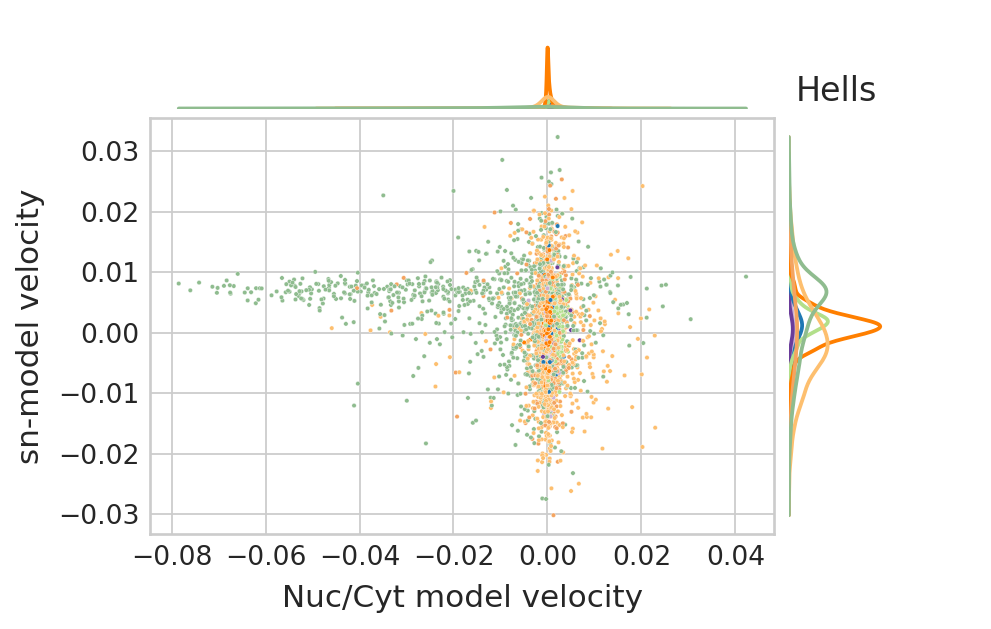

Pearson correlation for Hells of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=-0.1821597133019019, pvalue=2.1175702199697085e-36) 



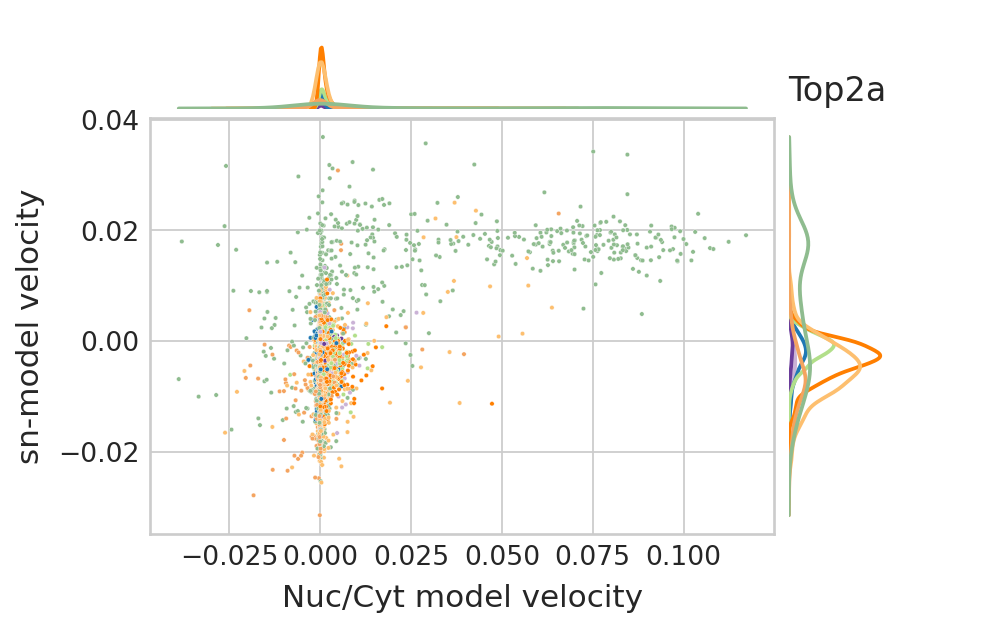

Pearson correlation for Top2a of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=0.5601386885073307, pvalue=0.0) 



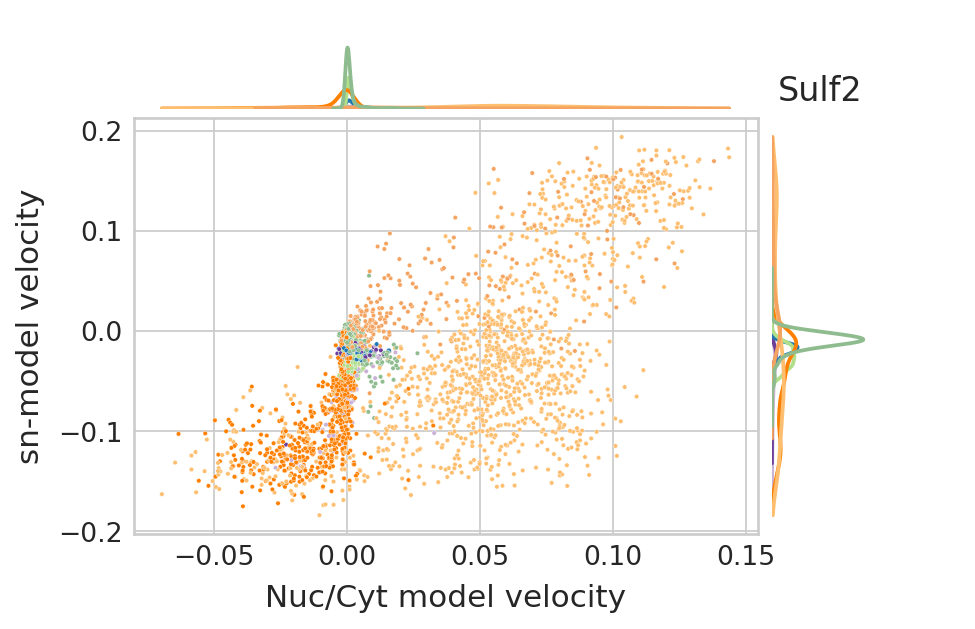

Pearson correlation for Sulf2 of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=0.5097274778988025, pvalue=9.3592770170884e-310) 



In [42]:
for gene in plot_genes:
    with mplscience.style_context():
        sns.set_style(style="whitegrid")
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.axis("off")
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        spacing = 0.015
        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom + height + spacing, width, 0.1]
        rect_histy = [left + width + spacing, bottom, 0.1, height]

        ax = fig.add_axes(rect_scatter)
        ax_histx = fig.add_axes(rect_histx, sharex=ax)
        ax_histy = fig.add_axes(rect_histy, sharey=ax)
        ax_histx.axis("off")
        ax_histy.axis("off")

        df = pd.DataFrame()
        df["sn-model velocity"] = adata_sn[sn_cells, gene].to_df("velocities_velovi")
        df["Nuc/Cyt model velocity"] = adata[sn_cells, gene].to_df("velocities_velovi_s_nuc")
        df["Celltype"] = adata[sn_cells, gene].obs.celltype
        clipy = (df["sn-model velocity"].min(), df["sn-model velocity"].max())
        clipx = (df["Nuc/Cyt model velocity"].min(), df["Nuc/Cyt model velocity"].max())
        sns.kdeplot(
            data=df,
            y="sn-model velocity",
            hue="Celltype",
            ax=ax_histy,
            legend=False,
            clip=clipy,
            palette=palette,
        )
        sns.kdeplot(
            data=df,
            x="Nuc/Cyt model velocity",
            hue="Celltype",
            ax=ax_histx,
            legend=False,
            clip=clipx,
            palette=palette,
        )
        sns.scatterplot(
            y="sn-model velocity",
            x="Nuc/Cyt model velocity",
            data=df,
            hue="Celltype",
            s=4,
            palette=palette,
            ax=ax,
            legend=False,
        )
        plt.title(f"{gene}")
        plt.show()
        print(
            f"Pearson correlation for {gene} of inferred Nuc/Cyt-model velocities and sn-model velocities",
            pearsonr(
                adata_sn[sn_cells, gene].to_df("velocities_velovi").squeeze(),
                adata[sn_cells, gene].to_df("velocities_velovi_s_nuc").squeeze(),
            ),
            "\n",
        )
        if SAVE_FIGURES:
            path = FIG_DIR / "velocity_comparison"
            path.mkdir(parents=True, exist_ok=True)
            fig.savefig(
                path / f"velo_s_nuc_{gene}_nuccyt_sn_e15.svg",
                format="svg",
                transparent=True,
                bbox_inches="tight",
            )

velocities_velovi_s_cyt

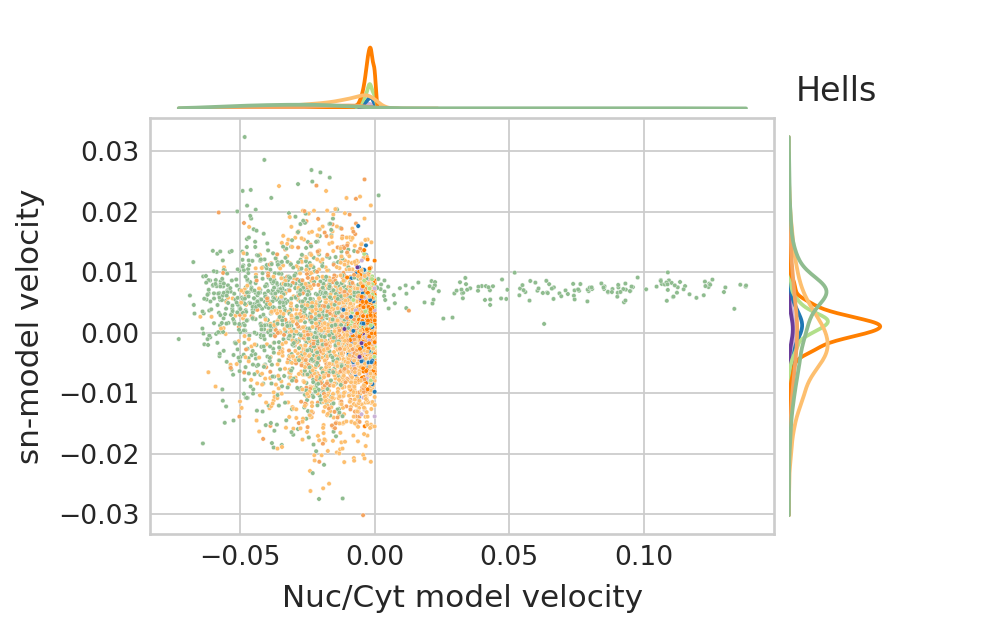

Pearson correlation for Hells of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=0.03768012400956356, pvalue=0.009727353651810676) 



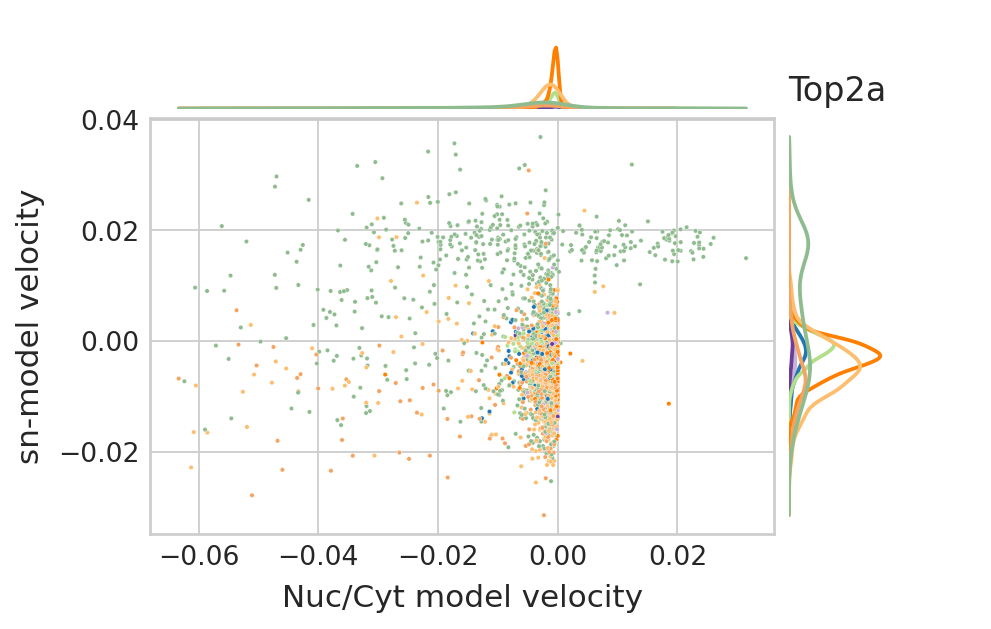

Pearson correlation for Top2a of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=-0.08195459648859729, pvalue=1.7949360785384976e-08) 



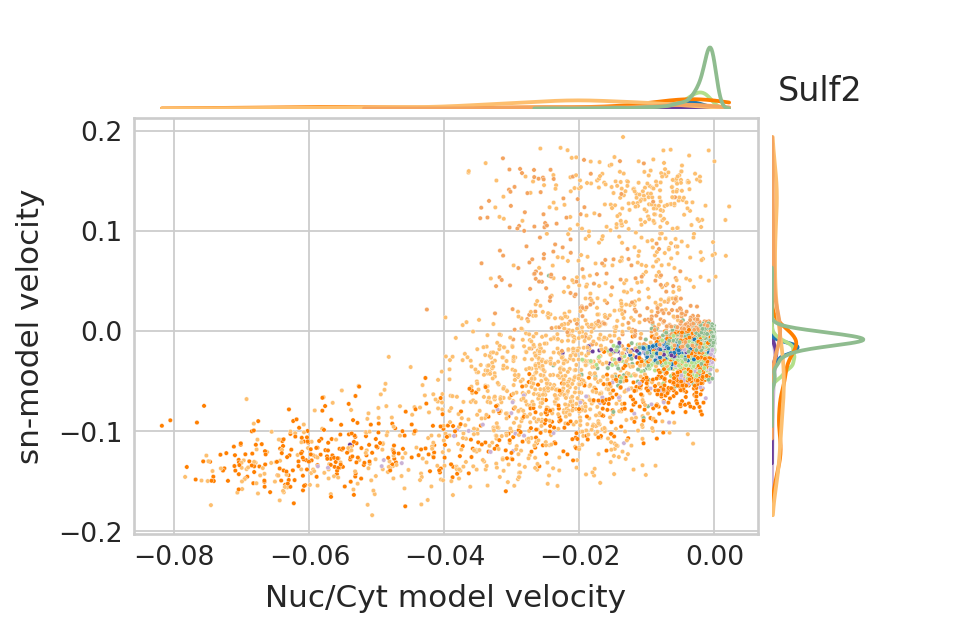

Pearson correlation for Sulf2 of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=0.4980834027837585, pvalue=1.1277587274199211e-293) 



In [43]:
for gene in plot_genes:
    with mplscience.style_context():
        sns.set_style(style="whitegrid")
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.axis("off")
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        spacing = 0.015
        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom + height + spacing, width, 0.1]
        rect_histy = [left + width + spacing, bottom, 0.1, height]

        ax = fig.add_axes(rect_scatter)
        ax_histx = fig.add_axes(rect_histx, sharex=ax)
        ax_histy = fig.add_axes(rect_histy, sharey=ax)
        ax_histx.axis("off")
        ax_histy.axis("off")

        df = pd.DataFrame()
        df["sn-model velocity"] = adata_sn[sn_cells, gene].to_df("velocities_velovi")
        df["Nuc/Cyt model velocity"] = adata[sn_cells, gene].to_df("velocities_velovi_s_cyt")
        df["Celltype"] = adata[sn_cells, gene].obs.celltype
        clipy = (df["sn-model velocity"].min(), df["sn-model velocity"].max())
        clipx = (df["Nuc/Cyt model velocity"].min(), df["Nuc/Cyt model velocity"].max())
        sns.kdeplot(
            data=df,
            y="sn-model velocity",
            hue="Celltype",
            ax=ax_histy,
            legend=False,
            clip=clipy,
            palette=palette,
        )
        sns.kdeplot(
            data=df,
            x="Nuc/Cyt model velocity",
            hue="Celltype",
            ax=ax_histx,
            legend=False,
            clip=clipx,
            palette=palette,
        )
        sns.scatterplot(
            y="sn-model velocity",
            x="Nuc/Cyt model velocity",
            data=df,
            hue="Celltype",
            s=4,
            palette=palette,
            ax=ax,
            legend=False,
        )
        plt.title(f"{gene}")
        plt.show()
        print(
            f"Pearson correlation for {gene} of inferred Nuc/Cyt-model velocities and sn-model velocities",
            pearsonr(
                adata_sn[sn_cells, gene].to_df("velocities_velovi").squeeze(),
                adata[sn_cells, gene].to_df("velocities_velovi_s_cyt").squeeze(),
            ),
            "\n",
        )
        if SAVE_FIGURES:
            path = FIG_DIR / "velocity_comparison"
            path.mkdir(parents=True, exist_ok=True)
            fig.savefig(
                path / f"velo_s_cyt_{gene}_nuccyt_sn_e15.svg",
                format="svg",
                transparent=True,
                bbox_inches="tight",
            )

velocity s_sum

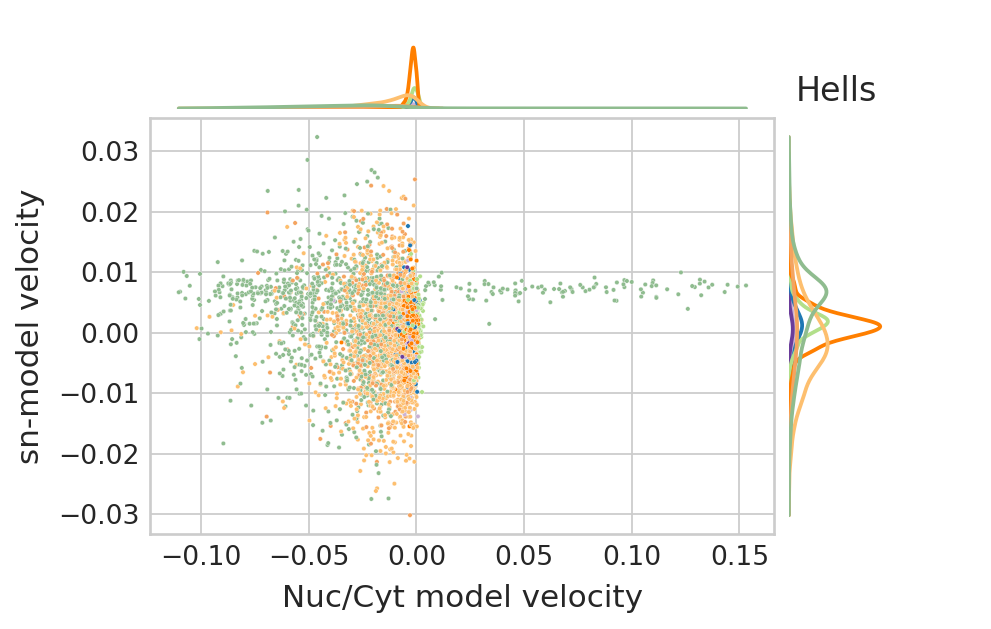

Pearson correlation for Hells of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=-0.04201519672661899, pvalue=0.003938219157433253) 



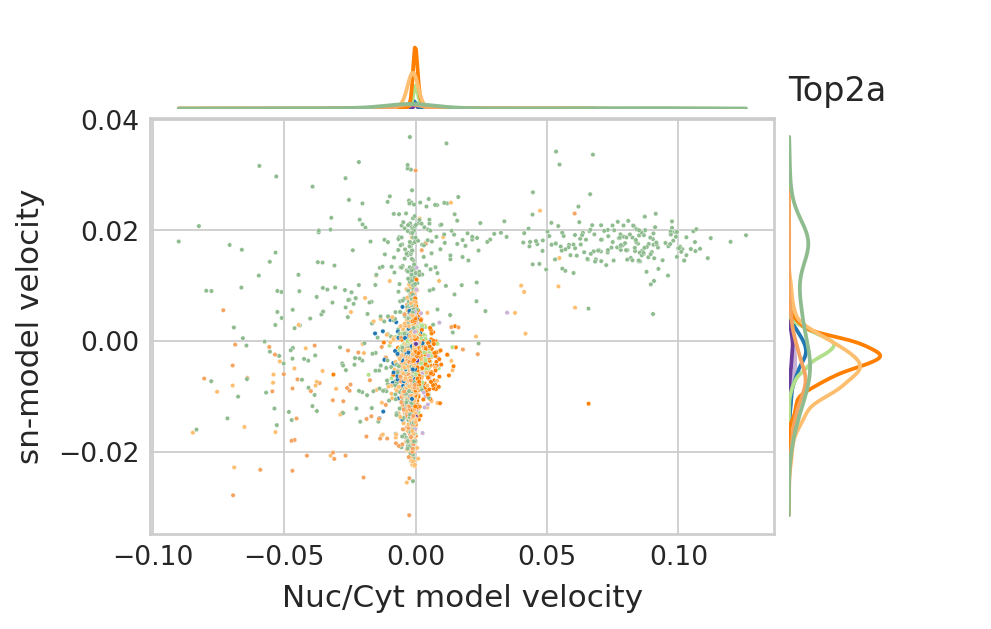

Pearson correlation for Top2a of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=0.44187669357428827, pvalue=3.0273401611600343e-224) 



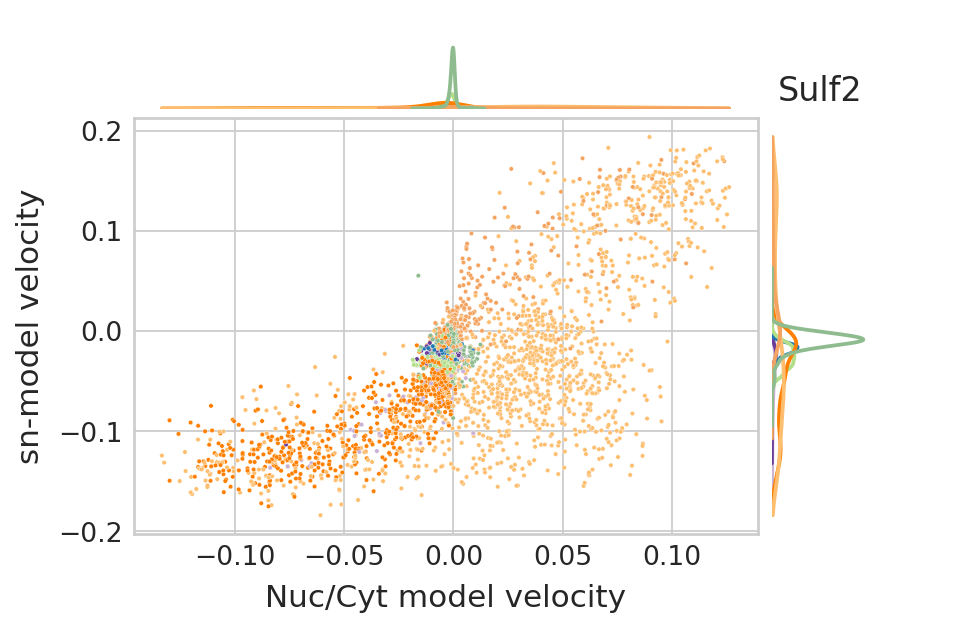

Pearson correlation for Sulf2 of inferred Nuc/Cyt-model velocities and sn-model velocities PearsonRResult(statistic=0.6745695363697625, pvalue=0.0) 



In [44]:
for gene in plot_genes:
    with mplscience.style_context():
        sns.set_style(style="whitegrid")
        fig, ax = plt.subplots(figsize=(6, 4))
        ax.axis("off")
        left, width = 0.1, 0.65
        bottom, height = 0.1, 0.65
        spacing = 0.015
        rect_scatter = [left, bottom, width, height]
        rect_histx = [left, bottom + height + spacing, width, 0.1]
        rect_histy = [left + width + spacing, bottom, 0.1, height]

        ax = fig.add_axes(rect_scatter)
        ax_histx = fig.add_axes(rect_histx, sharex=ax)
        ax_histy = fig.add_axes(rect_histy, sharey=ax)
        ax_histx.axis("off")
        ax_histy.axis("off")

        df = pd.DataFrame()
        df["sn-model velocity"] = adata_sn[sn_cells, gene].to_df("velocities_velovi")
        df["Nuc/Cyt model velocity"] = adata[sn_cells, gene].to_df("velocities_velovi_s_sum")
        df["Celltype"] = adata[sn_cells, gene].obs.celltype
        clipy = (df["sn-model velocity"].min(), df["sn-model velocity"].max())
        clipx = (df["Nuc/Cyt model velocity"].min(), df["Nuc/Cyt model velocity"].max())
        sns.kdeplot(
            data=df,
            y="sn-model velocity",
            hue="Celltype",
            ax=ax_histy,
            legend=False,
            clip=clipy,
            palette=palette,
        )
        sns.kdeplot(
            data=df,
            x="Nuc/Cyt model velocity",
            hue="Celltype",
            ax=ax_histx,
            legend=False,
            clip=clipx,
            palette=palette,
        )
        sns.scatterplot(
            y="sn-model velocity",
            x="Nuc/Cyt model velocity",
            data=df,
            hue="Celltype",
            s=4,
            palette=palette,
            ax=ax,
            legend=False,
        )
        plt.title(f"{gene}")
        plt.show()
        print(
            f"Pearson correlation for {gene} of inferred Nuc/Cyt-model velocities and sn-model velocities",
            pearsonr(
                adata_sn[sn_cells, gene].to_df("velocities_velovi").squeeze(),
                adata[sn_cells, gene].to_df("velocities_velovi_s_sum").squeeze(),
            ),
            "\n",
        )
        if SAVE_FIGURES:
            path = FIG_DIR / "velocity_comparison"
            path.mkdir(parents=True, exist_ok=True)
            fig.savefig(
                path / f"velo_s_sum_{gene}_nuccyt_sn_e15.svg",
                format="svg",
                transparent=True,
                bbox_inches="tight",
            )

### Pearson correlation for all genes

## Compare scVI, scglue based models and check which `velo_mode` yields the highest correlation

In [46]:
# common_genes_scvi = list(set(adata_sc.var_names).intersection(set(adata_sn.var_names)).intersection(set(adata_scvi.var_names)).intersection(set(adata_integrated.var_names)))
sc_cells_scvi = list(set(adata_sc.obs_names).intersection(set(adata_scvi.obs_names)))
sn_cells_scvi = list(set(adata_sn.obs_names).intersection(set(adata_scvi.obs_names)))
sc_cells = list(set(adata_sc.obs_names).intersection(set(adata.obs_names)))
sn_cells = list(set(adata_sn.obs_names).intersection(set(adata.obs_names)))

common_genes = list(
    set(adata_sc.var_names)
    .intersection(set(adata_sn.var_names))
    .intersection(set(adata.var_names))
    .intersection(set(adata_scvi.var_names))
)
sc_cells = list(set(adata_sc.obs_names).intersection(set(adata.obs_names)))
sn_cells = list(set(adata_sn.obs_names).intersection(set(adata.obs_names)))

## Plot correlations

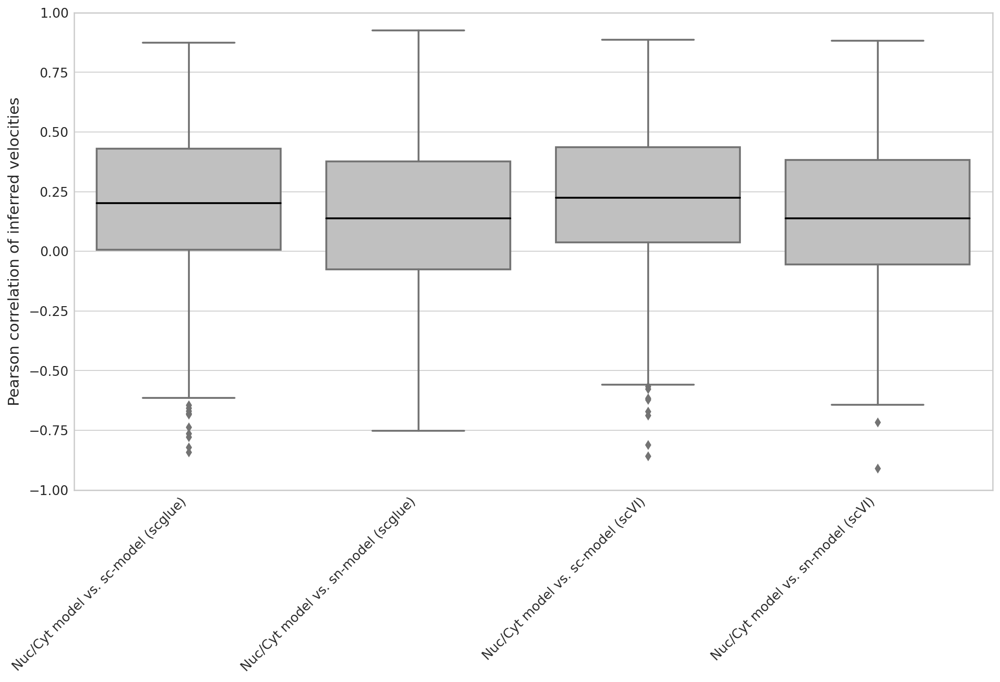

In [47]:
pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_sc_nuc_cyt = []
pearson_coeffs_sn_nuc_cyt = []

pearson_coeffs_sc_nuc_cyt_scvi = []
pearson_coeffs_sn_nuc_cyt_scvi = []

for gene in common_genes:
    pearson_coeffs_sc_nuc_cyt_scvi.append(
        pearsonr(
            adata_scvi[sc_cells_scvi, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sc[sc_cells_scvi, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sn_nuc_cyt_scvi.append(
        pearsonr(
            adata_scvi[sn_cells_scvi, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sn[sn_cells_scvi, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sc_nuc_cyt.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sn_nuc_cyt.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )


pearson_df = pd.DataFrame()
pearson_df["Nuc/Cyt model vs. sc-model (scglue)"] = pearson_coeffs_sc_nuc_cyt
pearson_df["Nuc/Cyt model vs. sn-model (scglue)"] = pearson_coeffs_sn_nuc_cyt
pearson_df["Nuc/Cyt model vs. sc-model (scVI)"] = pearson_coeffs_sc_nuc_cyt_scvi
pearson_df["Nuc/Cyt model vs. sn-model (scVI)"] = pearson_coeffs_sn_nuc_cyt_scvi

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(15, 8))
    sns.boxplot(
        data=pearson_df,
        color="silver",
        medianprops={"color": "black"},
    )
    ax.set_ylabel("Pearson correlation of inferred velocities")
    ax.set_ylim([-1, 1])
    plt.xticks(rotation=45, ha="right")
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "velo_s_cyt_pearson_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## snuc velo

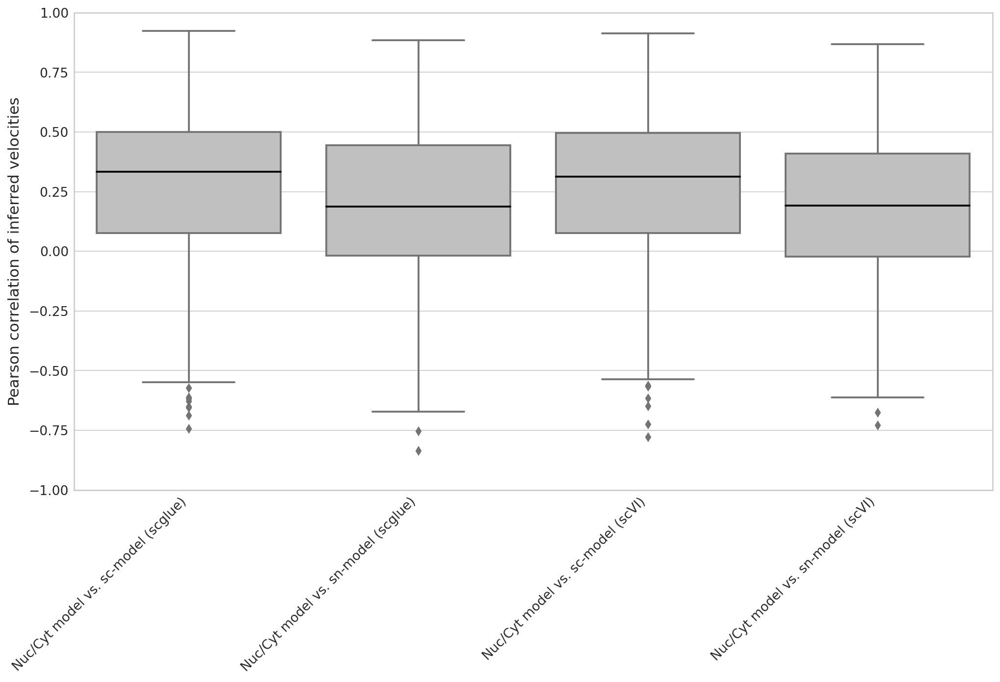

In [48]:
pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_sc_nuc_cyt = []
pearson_coeffs_sn_nuc_cyt = []

pearson_coeffs_sc_nuc_cyt_scvi = []
pearson_coeffs_sn_nuc_cyt_scvi = []

for gene in common_genes:
    pearson_coeffs_sc_nuc_cyt_scvi.append(
        pearsonr(
            adata_scvi[sc_cells_scvi, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sc[sc_cells_scvi, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sn_nuc_cyt_scvi.append(
        pearsonr(
            adata_scvi[sn_cells_scvi, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sn[sn_cells_scvi, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sc_nuc_cyt.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sn_nuc_cyt.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )


pearson_df = pd.DataFrame()
pearson_df["Nuc/Cyt model vs. sc-model (scglue)"] = pearson_coeffs_sc_nuc_cyt
pearson_df["Nuc/Cyt model vs. sn-model (scglue)"] = pearson_coeffs_sn_nuc_cyt
pearson_df["Nuc/Cyt model vs. sc-model (scVI)"] = pearson_coeffs_sc_nuc_cyt_scvi
pearson_df["Nuc/Cyt model vs. sn-model (scVI)"] = pearson_coeffs_sn_nuc_cyt_scvi

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(15, 8))
    sns.boxplot(
        data=pearson_df,
        color="silver",
        medianprops={"color": "black"},
    )
    ax.set_ylabel("Pearson correlation of inferred velocities")
    ax.set_ylim([-1, 1])
    plt.xticks(rotation=45, ha="right")
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "velo_s_cyt_pearson_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## s sum velo

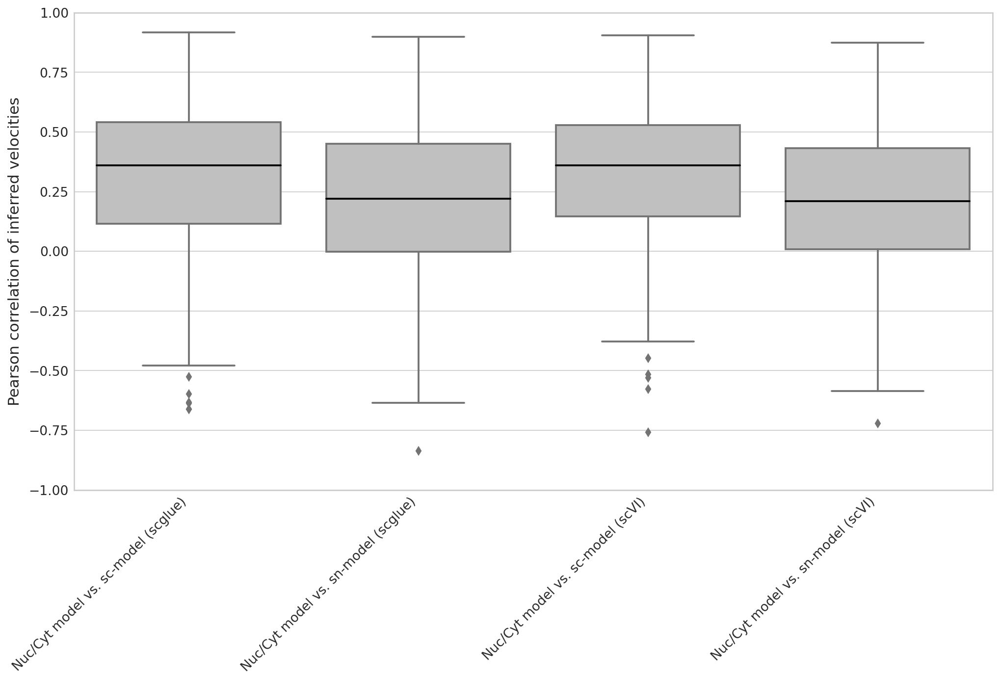

In [49]:
pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_sc_nuc_cyt = []
pearson_coeffs_sn_nuc_cyt = []

pearson_coeffs_sc_nuc_cyt_scvi = []
pearson_coeffs_sn_nuc_cyt_scvi = []

for gene in common_genes:
    pearson_coeffs_sc_nuc_cyt_scvi.append(
        pearsonr(
            adata_scvi[sc_cells_scvi, gene].layers["velocities_velovi_s_sum"].squeeze(),
            adata_sc[sc_cells_scvi, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sn_nuc_cyt_scvi.append(
        pearsonr(
            adata_scvi[sn_cells_scvi, gene].layers["velocities_velovi_s_sum"].squeeze(),
            adata_sn[sn_cells_scvi, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sc_nuc_cyt.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_sum"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

    pearson_coeffs_sn_nuc_cyt.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_sum"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )


pearson_df = pd.DataFrame()
pearson_df["Nuc/Cyt model vs. sc-model (scglue)"] = pearson_coeffs_sc_nuc_cyt
pearson_df["Nuc/Cyt model vs. sn-model (scglue)"] = pearson_coeffs_sn_nuc_cyt
pearson_df["Nuc/Cyt model vs. sc-model (scVI)"] = pearson_coeffs_sc_nuc_cyt_scvi
pearson_df["Nuc/Cyt model vs. sn-model (scVI)"] = pearson_coeffs_sn_nuc_cyt_scvi

with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(15, 8))
    sns.boxplot(
        data=pearson_df,
        color="silver",
        medianprops={"color": "black"},
    )
    ax.set_ylabel("Pearson correlation of inferred velocities")
    ax.set_ylim([-1, 1])
    plt.xticks(rotation=45, ha="right")
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "velo_s_sum_pearson_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## Finally compare scvi and scglue velocities

In [50]:
scvi_scglue_cells = list(set(adata_scvi.obs_names).intersection(set(adata.obs_names)))

common_genes = list(set(adata.var_names).intersection(set(adata_scvi.var_names)))


pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_scvi_scglue_velo_snuc = []
pearson_coeffs_scvi_scglue_velo_scyt = []
pearson_coeffs_scvi_scglue_velo_ssum = []

for gene in common_genes:
    pearson_coeffs_scvi_scglue_velo_snuc.append(
        pearsonr(
            adata_scvi[scvi_scglue_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata[scvi_scglue_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
        )[0]
    )

    pearson_coeffs_scvi_scglue_velo_scyt.append(
        pearsonr(
            adata_scvi[scvi_scglue_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata[scvi_scglue_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
        )[0]
    )

    pearson_coeffs_scvi_scglue_velo_ssum.append(
        pearsonr(
            adata_scvi[scvi_scglue_cells, gene].layers["velocities_velovi_s_sum"].squeeze(),
            adata[scvi_scglue_cells, gene].layers["velocities_velovi_s_sum"].squeeze(),
        )[0]
    )


pearson_df = pd.DataFrame()
pearson_df["scglue vs. scvi snuc"] = pearson_coeffs_scvi_scglue_velo_snuc
pearson_df["scglue vs. scvi scyt"] = pearson_coeffs_scvi_scglue_velo_scyt
pearson_df["scglue vs. scvi ssum"] = pearson_coeffs_scvi_scglue_velo_ssum

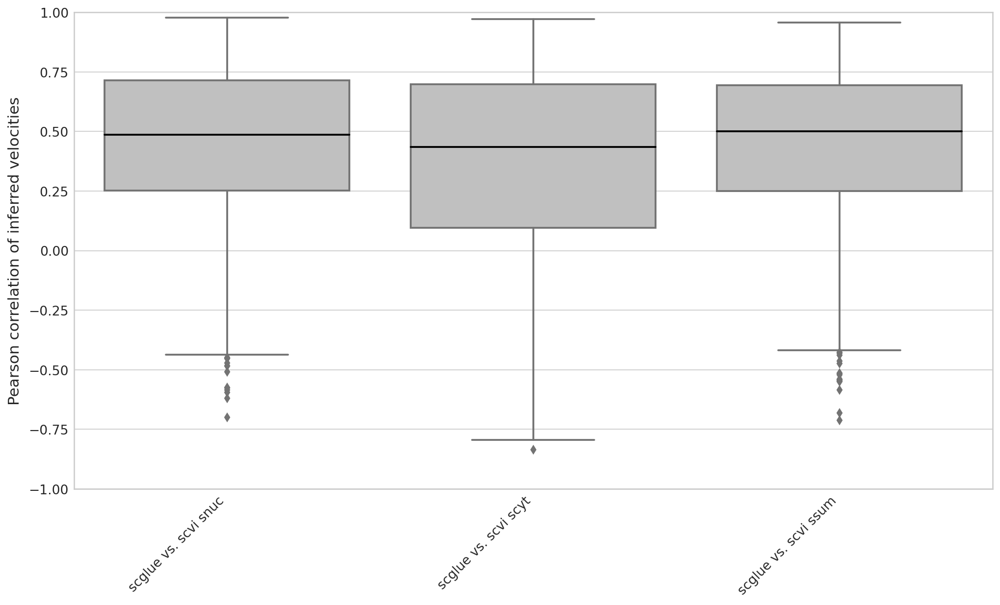

In [51]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(15, 8))
    sns.boxplot(
        data=pearson_df,
        color="silver",
        medianprops={"color": "black"},
    )
    ax.set_ylim([-1, 1])
    ax.set_ylabel("Pearson correlation of inferred velocities")
    plt.xticks(rotation=45, ha="right")
    plt.show()
    if SAVE_FIGURES:
        path = FIG_DIR / "velocity_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(
            path / "velo_scglue_vs_scvi_correlation_e15.svg",
            format="svg",
            transparent=True,
            bbox_inches="tight",
        )

## Final plot
for each velo mode one plot

In [52]:
names = ["Nuc/Cyt model", "sc-model", "sn-model"]

palette = dict(zip(names, sns.color_palette("colorblind").as_hex()[:3]))

##### scyt velo

In [53]:
sc_cells = list(set(adata_scvi.obs_names).intersection(set(adata.obs_names)).intersection(set(adata_sc.obs_names)))
sn_cells = list(set(adata_scvi.obs_names).intersection(set(adata.obs_names)).intersection(set(adata_sn.obs_names)))

common_genes_sc = list(
    set(adata.var_names).intersection(set(adata_scvi.var_names).intersection(set(adata_sc.var_names)))
)

common_genes_sn = list(
    set(adata.var_names).intersection(set(adata_scvi.var_names).intersection(set(adata_sn.var_names)))
)


pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_scglue_sc = []
pearson_coeffs_scglue_sn = []
pearson_coeffs_scvi_sc = []
pearson_coeffs_scvi_sn = []

for gene in common_genes_sc:
    pearson_coeffs_scglue_sc.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scvi_sc.append(
        pearsonr(
            adata_scvi[sc_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

for gene in common_genes_sn:
    pearson_coeffs_scglue_sn.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scvi_sn.append(
        pearsonr(
            adata_scvi[sn_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

pearson_df = pd.DataFrame()
pearson_df["Correlation"] = (
    pearson_coeffs_scglue_sc + pearson_coeffs_scglue_sn + pearson_coeffs_scvi_sc + pearson_coeffs_scvi_sn
)
pearson_df["Model"] = ["scglue"] * (len(pearson_coeffs_scglue_sc) + len(pearson_coeffs_scglue_sn)) + ["scvi"] * (
    len(pearson_coeffs_scvi_sc) + len(pearson_coeffs_scvi_sn)
)
pearson_df["comparison"] = (
    ["sc-model"] * len(pearson_coeffs_scglue_sc)
    + ["sn-model"] * len(pearson_coeffs_scglue_sn)
    + ["sc-model"] * len(pearson_coeffs_scvi_sc)
    + ["sn-model"] * len(pearson_coeffs_scvi_sn)
)

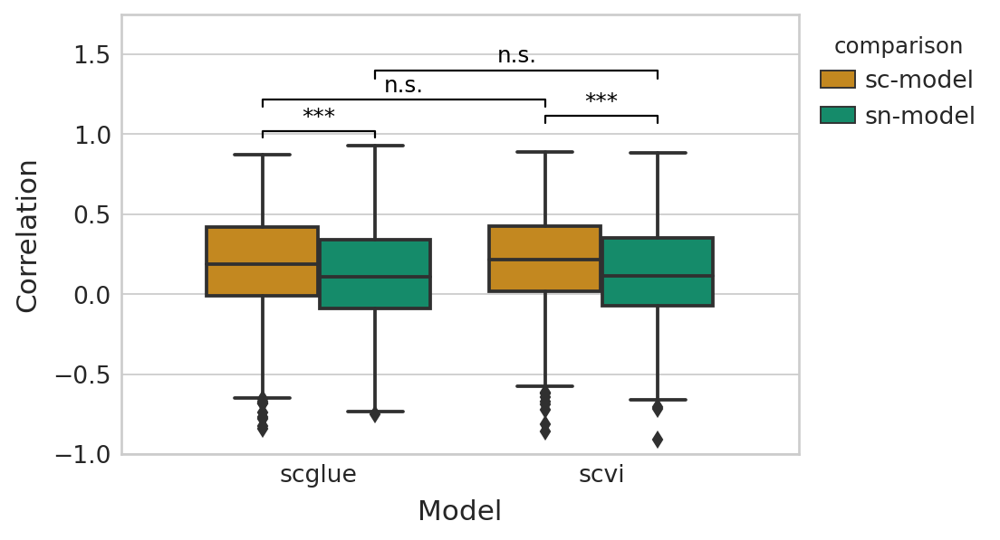

In [54]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.boxplot(
        data=pearson_df,
        x="Model",
        y="Correlation",
        hue="comparison",
        palette=palette,  # sns.color_palette("colorblind").as_hex()[:3],
    )
    y_min, y_max = ax.get_ylim()

    # compare scglue sn vs sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison != "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.20,
        right=0.2,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    # compare scvi sn vs sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison != "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=1.20,
        right=0.8,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    # compare scvi vs scglue (for sc)
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.20,
        right=0.8,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    ax.set_ylim([y_min, y_max + 0.5])

    # compare scvi vs scglue (for sn)
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sn-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sn-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0.20,
        right=1.2,
        significance=significance,
        lw=1,
        bracket_level=0.92,
        c="k",
        level=0,
    )

    ax.set_ylim([-1, 1.75])

    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    plt.show()

    if SAVE_FIGURES:
        path = FIG_DIR / "velo_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_compare_scvi_scglue_scyt_e15.svg", format="svg", transparent=True, bbox_inches="tight")

#### snuc

In [55]:
pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_scglue_sc = []
pearson_coeffs_scglue_sn = []
pearson_coeffs_scvi_sc = []
pearson_coeffs_scvi_sn = []

for gene in common_genes_sc:
    pearson_coeffs_scglue_sc.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scvi_sc.append(
        pearsonr(
            adata_scvi[sc_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

for gene in common_genes_sn:
    pearson_coeffs_scglue_sn.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scvi_sn.append(
        pearsonr(
            adata_scvi[sn_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

pearson_df = pd.DataFrame()
pearson_df["Correlation"] = (
    pearson_coeffs_scglue_sc + pearson_coeffs_scglue_sn + pearson_coeffs_scvi_sc + pearson_coeffs_scvi_sn
)
pearson_df["Model"] = ["scglue"] * (len(pearson_coeffs_scglue_sc) + len(pearson_coeffs_scglue_sn)) + ["scvi"] * (
    len(pearson_coeffs_scvi_sc) + len(pearson_coeffs_scvi_sn)
)
pearson_df["comparison"] = (
    ["sc-model"] * len(pearson_coeffs_scglue_sc)
    + ["sn-model"] * len(pearson_coeffs_scglue_sn)
    + ["sc-model"] * len(pearson_coeffs_scvi_sc)
    + ["sn-model"] * len(pearson_coeffs_scvi_sn)
)

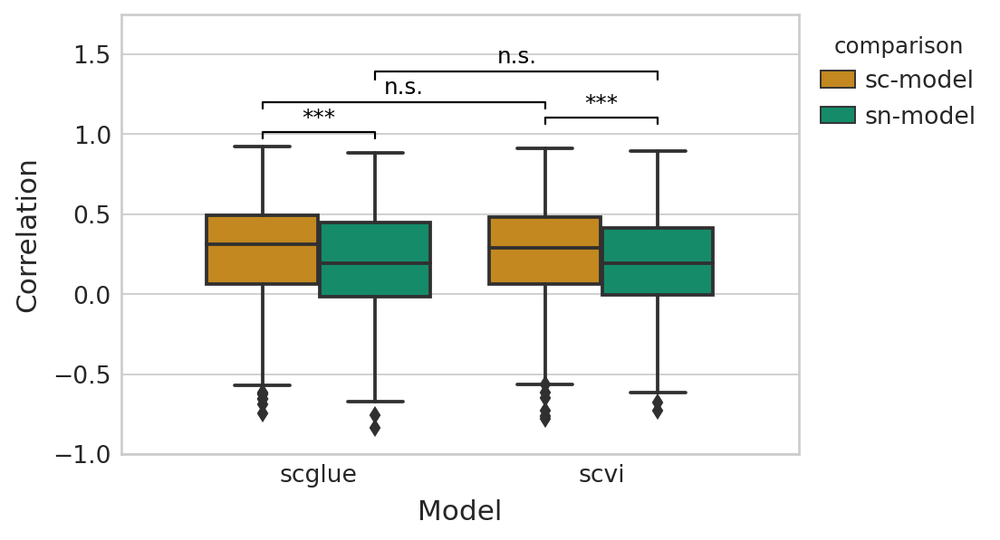

In [57]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.boxplot(
        data=pearson_df,
        x="Model",
        y="Correlation",
        hue="comparison",
        palette=palette,  # sns.color_palette("colorblind").as_hex()[:3],
    )
    y_min, y_max = ax.get_ylim()

    # compare scglue sn vs sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison != "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.20,
        right=0.2,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    # compare scvi sn vs sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison != "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=1.20,
        right=0.8,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    # compare scvi vs scglue (for sc)
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.20,
        right=0.8,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    ax.set_ylim([y_min, y_max + 0.5])

    # compare scvi vs scglue (for sn)
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sn-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sn-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0.20,
        right=1.2,
        significance=significance,
        lw=1,
        bracket_level=0.92,
        c="k",
        level=0,
    )

    ax.set_ylim([-1, 1.75])

    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    plt.show()

    if SAVE_FIGURES:
        path = FIG_DIR / "velo_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_compare_scvi_scglue_snuc_e15.svg", format="svg", transparent=True, bbox_inches="tight")

##### ssum

In [58]:
pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_scglue_sc = []
pearson_coeffs_scglue_sn = []
pearson_coeffs_scvi_sc = []
pearson_coeffs_scvi_sn = []

for gene in common_genes_sc:
    pearson_coeffs_scglue_sc.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scvi_sc.append(
        pearsonr(
            adata_scvi[sc_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

for gene in common_genes_sn:
    pearson_coeffs_scglue_sn.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scvi_sn.append(
        pearsonr(
            adata_scvi[sn_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

pearson_df = pd.DataFrame()
pearson_df["Correlation"] = (
    pearson_coeffs_scglue_sc + pearson_coeffs_scglue_sn + pearson_coeffs_scvi_sc + pearson_coeffs_scvi_sn
)
pearson_df["Model"] = ["scglue"] * (len(pearson_coeffs_scglue_sc) + len(pearson_coeffs_scglue_sn)) + ["scvi"] * (
    len(pearson_coeffs_scvi_sc) + len(pearson_coeffs_scvi_sn)
)
pearson_df["comparison"] = (
    ["sc-model"] * len(pearson_coeffs_scglue_sc)
    + ["sn-model"] * len(pearson_coeffs_scglue_sn)
    + ["sc-model"] * len(pearson_coeffs_scvi_sc)
    + ["sn-model"] * len(pearson_coeffs_scvi_sn)
)

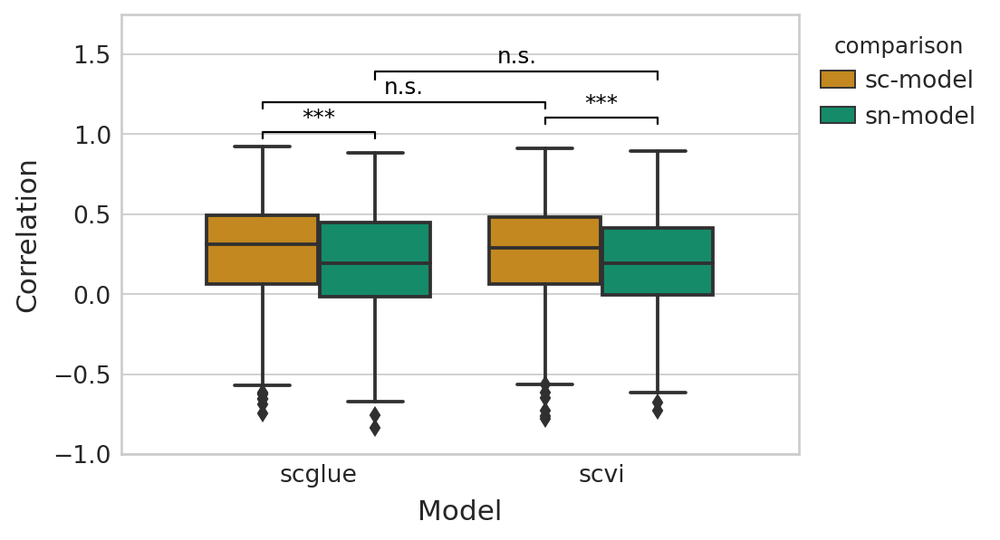

In [59]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.boxplot(
        data=pearson_df,
        x="Model",
        y="Correlation",
        hue="comparison",
        palette=palette,  # sns.color_palette("colorblind").as_hex()[:3],
    )
    y_min, y_max = ax.get_ylim()

    # compare scglue sn vs sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison != "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.20,
        right=0.2,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    # compare scvi sn vs sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison != "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=1.20,
        right=0.8,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    # compare scvi vs scglue (for sc)
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sc-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.20,
        right=0.8,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )

    ax.set_ylim([y_min, y_max + 0.5])

    # compare scvi vs scglue (for sn)
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.Model == "scvi") & (pearson_df.comparison == "sn-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.Model == "scglue") & (pearson_df.comparison == "sn-model") & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="two-sided",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0.20,
        right=1.2,
        significance=significance,
        lw=1,
        bracket_level=0.92,
        c="k",
        level=0,
    )

    ax.set_ylim([-1, 1.75])

    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    plt.show()

    if SAVE_FIGURES:
        path = FIG_DIR / "velo_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "velo_compare_scvi_scglue_ssum_e15.svg", format="svg", transparent=True, bbox_inches="tight")

## Finally compare velo modes

In [60]:
pearson_dfs = pd.DataFrame(columns=["Pearson correlation"])
pearson_coeffs_scglue_sc_velo_scyt = []
pearson_coeffs_scglue_sc_velo_snuc = []
pearson_coeffs_scglue_sc_velo_ssum = []
pearson_coeffs_scglue_sn_velo_scyt = []
pearson_coeffs_scglue_sn_velo_snuc = []
pearson_coeffs_scglue_sn_velo_ssum = []

for gene in common_genes_sc:
    pearson_coeffs_scglue_sc_velo_scyt.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scglue_sc_velo_snuc.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scglue_sc_velo_ssum.append(
        pearsonr(
            adata[sc_cells, gene].layers["velocities_velovi_s_sum"].squeeze(),
            adata_sc[sc_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )


for gene in common_genes_sn:
    pearson_coeffs_scglue_sn_velo_scyt.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_cyt"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scglue_sn_velo_snuc.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_nuc"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )
    pearson_coeffs_scglue_sn_velo_ssum.append(
        pearsonr(
            adata[sn_cells, gene].layers["velocities_velovi_s_sum"].squeeze(),
            adata_sn[sn_cells, gene].layers["velocities_velovi"].squeeze(),
        )[0]
    )

In [61]:
pearson_df = pd.DataFrame()
pearson_df["Correlation"] = (
    pearson_coeffs_scglue_sc_velo_scyt
    + pearson_coeffs_scglue_sc_velo_snuc
    + pearson_coeffs_scglue_sc_velo_ssum
    + pearson_coeffs_scglue_sn_velo_scyt
    + pearson_coeffs_scglue_sn_velo_snuc
    + pearson_coeffs_scglue_sn_velo_ssum
)

pearson_df["VeloMode"] = (
    ["scyt"] * len(pearson_coeffs_scglue_sc_velo_scyt)
    + ["snuc"] * len(pearson_coeffs_scglue_sc_velo_snuc)
    + ["ssum"] * len(pearson_coeffs_scglue_sc_velo_ssum)
    + ["scyt"] * len(pearson_coeffs_scglue_sn_velo_scyt)
    + ["snuc"] * len(pearson_coeffs_scglue_sn_velo_snuc)
    + ["ssum"] * len(pearson_coeffs_scglue_sn_velo_ssum)
)

pearson_df["comparison"] = ["sc-model"] * (3 * len(pearson_coeffs_scglue_sc_velo_snuc)) + ["sn-model"] * (
    3 * len(pearson_coeffs_scglue_sn)
)

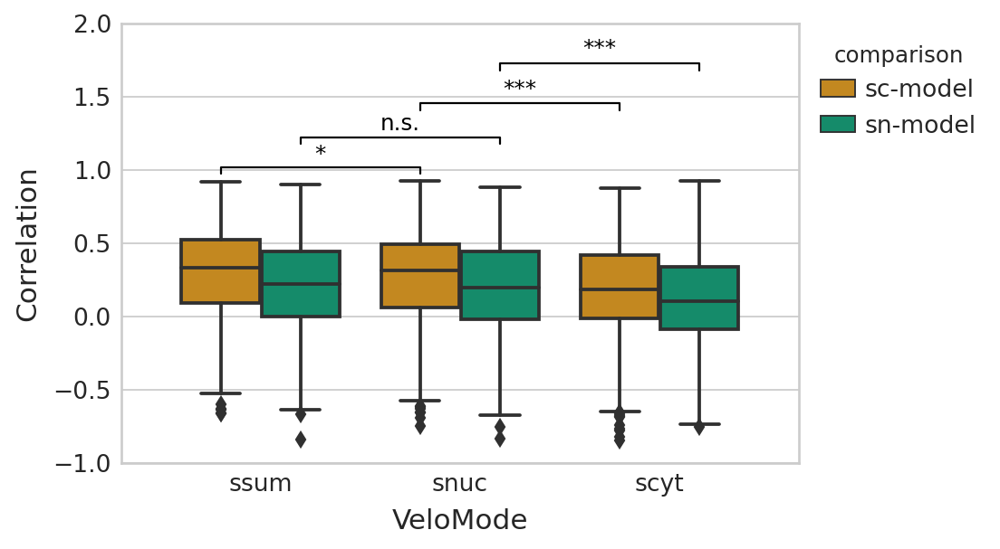

In [62]:
with mplscience.style_context():
    sns.set_style(style="whitegrid")
    fig, ax = plt.subplots(figsize=(6, 4))
    sns.boxplot(
        data=pearson_df,
        x="VeloMode",
        y="Correlation",
        hue="comparison",
        palette=palette,
        order=["ssum", "snuc", "scyt"],
    )
    y_min, y_max = ax.get_ylim()
    # compare ssum to snuc for sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.VeloMode == "ssum")
            & (pearson_df.comparison == "sc-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.VeloMode == "snuc")
            & (pearson_df.comparison == "sc-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=-0.20,
        right=0.8,
        significance=significance,
        lw=1,
        bracket_level=1,
        c="k",
        level=0,
    )
    # compare ssum to snuc for sn
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.VeloMode == "ssum")
            & (pearson_df.comparison == "sn-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.VeloMode == "snuc")
            & (pearson_df.comparison == "sn-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0.20,
        right=1.2,
        significance=significance,
        lw=1,
        bracket_level=1.1,
        c="k",
        level=0,
    )

    # compare snuc to scyt for sc
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.VeloMode == "snuc")
            & (pearson_df.comparison == "sc-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.VeloMode == "scyt")
            & (pearson_df.comparison == "sc-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=0.8,
        right=1.8,
        significance=significance,
        lw=1,
        bracket_level=1.1,
        c="k",
        level=0,
    )

    # compare snuc to scyt for sn
    ttest_res = ttest_ind(
        pearson_df.loc[
            (pearson_df.VeloMode == "snuc")
            & (pearson_df.comparison == "sn-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        pearson_df.loc[
            (pearson_df.VeloMode == "scyt")
            & (pearson_df.comparison == "sn-model")
            & ~(pearson_df.Correlation.isnull()),
            "Correlation",
        ].values,
        equal_var=False,
        alternative="greater",
    )
    significance = _get_significance(ttest_res.pvalue)
    _add_significance(
        ax=ax,
        left=1.2,
        right=2.2,
        significance=significance,
        lw=1,
        bracket_level=1.1,
        c="k",
        level=0,
    )

    ax.set_ylim([-1, 2])

    sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
    plt.show()

    if SAVE_FIGURES:
        path = FIG_DIR / "velo_comparison"
        path.mkdir(parents=True, exist_ok=True)
        fig.savefig(path / "compare_velo_modes_scglue_e15.svg", format="svg", transparent=True, bbox_inches="tight")